In [60]:
import keras
import keras.backend as K
from keras.datasets import mnist
from keras.models import Model, Sequential
from keras.layers import Input, Dense, Dropout, Activation
from keras.optimizers import RMSprop
from keras.callbacks import CSVLogger, Callback, ReduceLROnPlateau
from keras.layers.noise import AlphaDropout
import keras.activations
import numpy as np
import pandas as pd
import matplotlib as mpl
from mpl_toolkits.mplot3d import Axes3D
# %matplotlib notebook
%matplotlib inline
import matplotlib.pyplot as plt
from IPython.display import display, HTML


X values are just linear sequence

In [61]:
x_train = np.linspace(0., 0.099, 100)
x_test = np.linspace(0.1, 0.109, 10)

print(x_train)
print(x_test)

[0.    0.001 0.002 0.003 0.004 0.005 0.006 0.007 0.008 0.009 0.01  0.011
 0.012 0.013 0.014 0.015 0.016 0.017 0.018 0.019 0.02  0.021 0.022 0.023
 0.024 0.025 0.026 0.027 0.028 0.029 0.03  0.031 0.032 0.033 0.034 0.035
 0.036 0.037 0.038 0.039 0.04  0.041 0.042 0.043 0.044 0.045 0.046 0.047
 0.048 0.049 0.05  0.051 0.052 0.053 0.054 0.055 0.056 0.057 0.058 0.059
 0.06  0.061 0.062 0.063 0.064 0.065 0.066 0.067 0.068 0.069 0.07  0.071
 0.072 0.073 0.074 0.075 0.076 0.077 0.078 0.079 0.08  0.081 0.082 0.083
 0.084 0.085 0.086 0.087 0.088 0.089 0.09  0.091 0.092 0.093 0.094 0.095
 0.096 0.097 0.098 0.099]
[0.1   0.101 0.102 0.103 0.104 0.105 0.106 0.107 0.108 0.109]


Our simple function that we want our neural network to learn

In [62]:
def func(x, a, b):
    return a * x + b

We want the network to find those 0.1 weight for kernel and 0.3 for bias

In [63]:
y_train = func(x_train, 0.1, 0.3)
y_test = func(x_test, 0.1, 0.3)

print(y_train)
print(y_test)

[0.3    0.3001 0.3002 0.3003 0.3004 0.3005 0.3006 0.3007 0.3008 0.3009
 0.301  0.3011 0.3012 0.3013 0.3014 0.3015 0.3016 0.3017 0.3018 0.3019
 0.302  0.3021 0.3022 0.3023 0.3024 0.3025 0.3026 0.3027 0.3028 0.3029
 0.303  0.3031 0.3032 0.3033 0.3034 0.3035 0.3036 0.3037 0.3038 0.3039
 0.304  0.3041 0.3042 0.3043 0.3044 0.3045 0.3046 0.3047 0.3048 0.3049
 0.305  0.3051 0.3052 0.3053 0.3054 0.3055 0.3056 0.3057 0.3058 0.3059
 0.306  0.3061 0.3062 0.3063 0.3064 0.3065 0.3066 0.3067 0.3068 0.3069
 0.307  0.3071 0.3072 0.3073 0.3074 0.3075 0.3076 0.3077 0.3078 0.3079
 0.308  0.3081 0.3082 0.3083 0.3084 0.3085 0.3086 0.3087 0.3088 0.3089
 0.309  0.3091 0.3092 0.3093 0.3094 0.3095 0.3096 0.3097 0.3098 0.3099]
[0.31   0.3101 0.3102 0.3103 0.3104 0.3105 0.3106 0.3107 0.3108 0.3109]


One of the ways we will be evaluating the progress of the network with each optimizer configuration is to let them to start from the same point (1., 0.) and then move towards the (0.1, 0.3) point. In order to visualize this first point we need to find the starting Mean Squared Error value for those initial weights.

In [64]:
base_error = np.mean(np.square(func(x_train, 1., 0.) - func(x_train, 0.1, 0.3)), axis=-1)
base_error

0.065929635

Common hyperparameters

In [65]:
batch_size = 10
epochs = 100
units = 1

# Here we will store our training histories
histories = {}

This custom callback will help us to record the weights on each epoch so we then can visualize the path of the optimizer

In [66]:
class RecordOutputsWeights(Callback):

    def __init__(self, w_holder):
        super(Callback, self).__init__()
        self.w_holder = w_holder
    
    def on_train_begin(self, logs=None):
        layers = self.model.layers
        for layer in layers:
            weights = layer.get_weights() 
            if len(weights) > 0:
                config = layer.get_config()
                self.w_holder.append([weights[0][0][0], weights[1][0]])
                
    def on_epoch_end(self, epoch, logs=None):
        layers = self.model.layers
        for layer in layers:
            weights = layer.get_weights() 

            if len(weights) > 0:
#                 weights = np.array(weights[1])
                config = layer.get_config()
                
                self.w_holder.append([weights[0][0][0], weights[1][0]])
                

`train` function builds the model and performs training. It accepts the list of optimizer configurations, the name of the optimizer and the type of initialization for the Dense layer. Returns the list of training history objects, which can be passed to `plot_training` function.

In [67]:
def train(configs, optimizer, initializer = 'default'):
    tr_hist = []
    
    for cfg in configs:
        print("Training config %s" % str(cfg))
        w_holder = []
        K.clear_session()
        K.reset_uids()
        model = Sequential()
        
        if initializer == 'default':
            model.add(Dense(units, input_dim=1, activation='linear', name = 'input'))
        else:
            model.add(Dense(units, input_dim=1, kernel_initializer = initializer, activation='linear', name = 'input'))
            
        if optimizer == 'rmsp':    
            opt = keras.optimizers.rmsprop(lr=cfg['lr'], rho = cfg['rho'])
            
        elif optimizer == 'sgd':
            opt = keras.optimizers.SGD(lr=cfg['lr'], momentum=cfg['momentum'], nesterov=cfg['nesterov'])

        elif optimizer == 'Adadelta':
            opt = keras.optimizers.Adadelta(lr=cfg['lr'], rho=cfg['rho'])

        elif optimizer == 'adam':
            opt = keras.optimizers.Adam(lr=cfg['lr'], amsgrad=cfg['amsgrad'], beta_1=cfg['beta_1'], beta_2=cfg['beta_2'])

        elif optimizer == 'Adagrad':
            opt = keras.optimizers.Adagrad(lr=cfg['lr'])

        elif optimizer == 'Adamax':
            opt = keras.optimizers.Adamax(lr=cfg['lr'], beta_1=cfg['beta_1'], beta_2=cfg['beta_2'])

        elif optimizer == 'Nadam':
            opt = keras.optimizers.Nadam(lr=cfg['lr'], beta_1=cfg['beta_1'], beta_2=cfg['beta_2'])
        
        model.compile(optimizer=opt, loss='mse')
        
        recorder = RecordOutputsWeights(w_holder)
        history = model.fit(x_train, y_train,
                            batch_size=batch_size,
                            epochs=epochs,
                            verbose=0,
                            shuffle=True,
                            validation_data=(x_test, y_test),
                            callbacks=[recorder])

        preds = model.predict([0., 1.])
        print ('Prediction for 0.: %0.4f, should be 0.3' % preds[0][0])
        print ('Prediction for 0.1: %0.4f, should be 0.4' % preds[1][0])
        print ('MSE: ' + str(history.history['loss'][-1]) + '\n')

        w_a = []
        w_b = []
        for w in w_holder:
            w_a.append(w[0])
            w_b.append(w[1])

        losses = history.history['loss']
        losses.insert(0, base_error)
        tr_hist.append({
            'w_a': w_a,
            'w_b': w_b,
            'loss': losses,
            'pred_0':preds[0][0],
            'pred_01': preds[1][0],
            'optimizer': optimizer,
            'label': ', '.join([key + ': ' + str(value) for key, value in cfg.items()])
        })
    print('-'*30)
    return tr_hist

`plot_training` function accepts the object with our training history and some other supplementarty info and plots 2 3D graphs of the MSE on each epoch with respect to relevant kernel and bias weights. The plots visualize the same MSE from 4 different angles, so that you are able to see the differences in the paths.

In [68]:
def plot_training(training_history, title):
    
    # Let's first sort the training history objects so that the models with lower final MSE are at the top of the list
    # This way they will be drawn first, and will not overlap the models, which follow the same path, but have stopped
    # improving earlier.
    training_history = sorted(training_history, key=lambda k: k['loss'][-1]) 
    
    fig = plt.figure(figsize=(20,20))
    fig.suptitle(title, fontsize = 16)
    
    ax = fig.add_subplot(2,2,1, projection='3d')
    i=1
    for t_h in training_history:
        cols = np.linspace(0., 1., len(t_h['loss'])) 
        ax.plot(t_h['w_a'], t_h['w_b'], t_h['loss'], marker = ".", label = '%d: %s' % (i, t_h['label']))
        i+=1
        
    ax.scatter([0.1], [0.3], [0.], marker = 'o', label = 'Global minima', color = 'k', s = 300)
    ax.view_init(30, 120)
    ax.legend()
    plt.xlabel('Kernel')
    plt.ylabel('Bias')
    
    ax = fig.add_subplot(2,2,2, projection='3d')
    i=1
    for t_h in training_history:
        cols = np.linspace(0., 1., len(t_h['loss'])) 
        ax.plot(t_h['w_a'], t_h['w_b'], t_h['loss'], marker = ".", label = '%d: %s' % (i, t_h['label']))
        i+=1

    ax.scatter([0.1], [0.3], [0.], marker = 'o', label = 'Global minima', color = 'k', s = 300)
    ax.view_init(30, 30)
    ax.legend()
    plt.xlabel('Kernel')
    plt.ylabel('Bias')
    
    ax = fig.add_subplot(2,2,3, projection='3d')
    i=1
    for t_h in training_history:
        cols = np.linspace(0., 1., len(t_h['loss'])) 
        ax.plot(t_h['w_a'], t_h['w_b'], t_h['loss'], marker = ".", label = '%d: %s' % (i, t_h['label']))
        i+=1

    ax.scatter([0.1], [0.3], [0.], marker = 'o', label = 'Global minima', color = 'k', s = 300)
    ax.view_init(2, 120)
    ax.legend()
    plt.xlabel('Kernel')
    plt.ylabel('Bias')
    
    ax = fig.add_subplot(2,2,4, projection='3d')
    i=1
    for t_h in training_history:
        cols = np.linspace(0., 1., len(t_h['loss'])) 
        ax.plot(t_h['w_a'], t_h['w_b'], t_h['loss'], marker = ".", label = '%d: %s' % (i, t_h['label']))
        i+=1

    ax.scatter([0.1], [0.3], [0.], marker = 'o', label = 'Global minima', color = 'k', s = 300)
    ax.view_init(2, 330)
    ax.legend()
    plt.xlabel('Kernel')
    plt.ylabel('Bias')
    
    plt.show()
    
    stats = pd.DataFrame(columns = ['Configuration', 'a', 'b', 'Prediction for 0.0', 'Prediction for 1.0', 'Final MSE'])
    
    for i in range(len(training_history)):
        stats.loc[i] = [
            training_history[i]['label'],
            training_history[i]['w_a'][-1],
            training_history[i]['w_b'][-1],
            training_history[i]['pred_0'],
            training_history[i]['pred_01'],
            training_history[i]['loss'][-1]
        ]
    display(stats)

# SGD
## Momentum

In [69]:
configs = [
    {'momentum': 0.0, 'nesterov': False, 'lr': 0.1 },
    {'momentum': 0.1, 'nesterov': False, 'lr': 0.1 },
    {'momentum': 0.5, 'nesterov': False, 'lr': 0.1 },
    {'momentum': 0.9, 'nesterov': False, 'lr': 0.1 },
    {'momentum': 0.95, 'nesterov': False, 'lr': 0.1 },
    {'momentum': 0.99, 'nesterov': False, 'lr': 0.1 },
    {'momentum': 0.999, 'nesterov': False, 'lr': 0.1 },
    {'momentum': 0.9999, 'nesterov': False, 'lr': 0.1 },
]

histories['SGD. Momentum. Ones'] = train(configs, 'sgd', 'ones')
# histories['SGD. Momentum. Default'] = train(configs, 'sgd')

Training config {'momentum': 0.0, 'nesterov': False, 'lr': 0.1}
Prediction for 0.: 0.2602, should be 0.3
Prediction for 0.1: 1.1317, should be 0.4
MSE: 0.0005062429612735286

Training config {'momentum': 0.1, 'nesterov': False, 'lr': 0.1}
Prediction for 0.: 0.2631, should be 0.3
Prediction for 0.1: 1.1207, should be 0.4
MSE: 0.0005008084874134511

Training config {'momentum': 0.5, 'nesterov': False, 'lr': 0.1}
Prediction for 0.: 0.2673, should be 0.3
Prediction for 0.1: 1.0199, should be 0.4
MSE: 0.00036621847830247133

Training config {'momentum': 0.9, 'nesterov': False, 'lr': 0.1}
Prediction for 0.: 0.2933, should be 0.3
Prediction for 0.1: 0.5609, should be 0.4
MSE: 2.4101299641188233e-05

Training config {'momentum': 0.95, 'nesterov': False, 'lr': 0.1}
Prediction for 0.: 0.2989, should be 0.3
Prediction for 0.1: 0.4226, should be 0.4
MSE: 5.095536181443095e-07

Training config {'momentum': 0.99, 'nesterov': False, 'lr': 0.1}
Prediction for 0.: 0.2995, should be 0.3
Prediction for 0

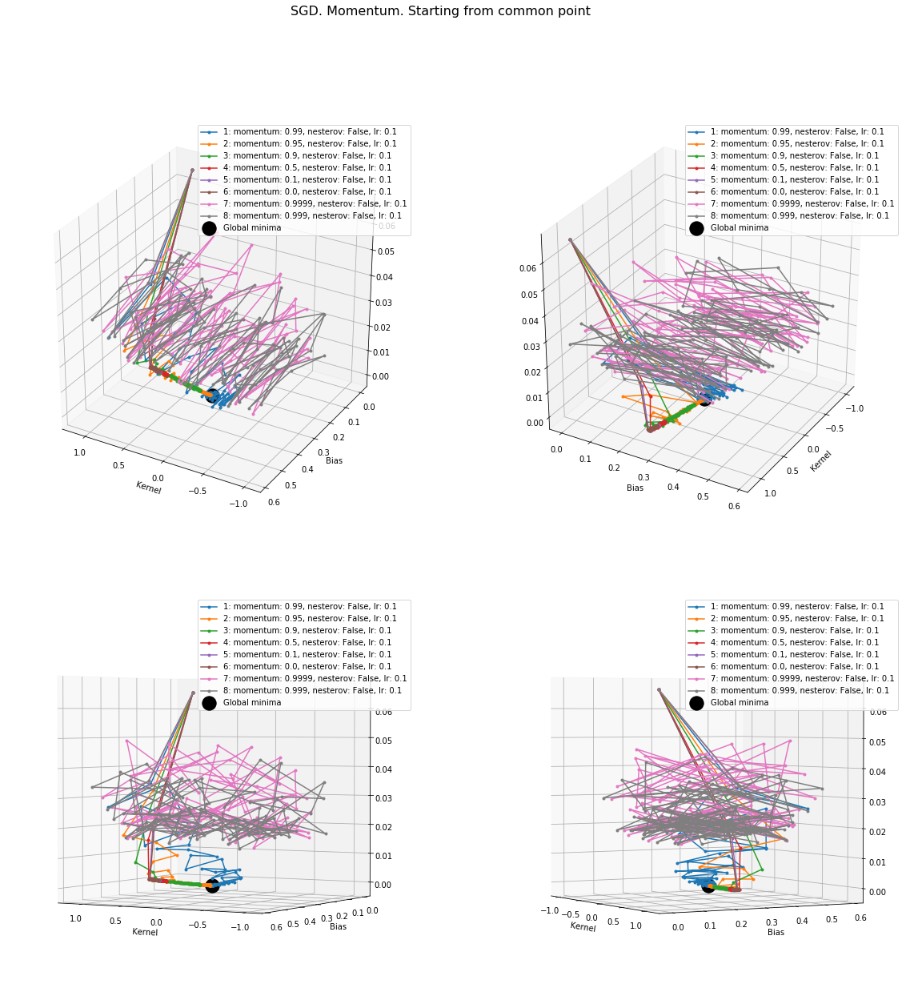

,Configuration,a,b,Prediction for 0.0,Prediction for 1.0,Final MSE
0,"momentum: 0.99, nesterov: False, lr: 0.1",0.101020,0.299459,0.299459,0.400479,1.469208e-07
1,"momentum: 0.95, nesterov: False, lr: 0.1",0.123697,0.298909,0.298909,0.422606,5.095536e-07
2,"momentum: 0.9, nesterov: False, lr: 0.1",0.267552,0.293334,0.293334,0.560886,2.410130e-05
3,"momentum: 0.5, nesterov: False, lr: 0.1",0.752551,0.267315,0.267315,1.019866,3.662185e-04
4,"momentum: 0.1, nesterov: False, lr: 0.1",0.857635,0.263059,0.263059,1.120694,5.008085e-04
5,"momentum: 0.0, nesterov: False, lr: 0.1",0.871561,0.260159,0.260159,1.131720,5.062430e-04
6,"momentum: 0.9999, nesterov: False, lr: 0.1",0.643144,0.057436,0.057436,0.700580,2.115454e-02
7,"momentum: 0.999, nesterov: False, lr: 0.1",0.628308,0.062314,0.062314,0.690621,2.192000e-02


In [70]:
plot_training(histories['SGD. Momentum. Ones'], 'SGD. Momentum. Starting from common point')
# plot_training(histories['SGD. Momentum. Default'], 'SGD. Momentum. Default initialization')

## Nesterov = True

In [71]:
configs = [
    {'momentum': 0.0, 'nesterov': True, 'lr': 0.1 },
    {'momentum': 0.1, 'nesterov': True, 'lr': 0.1 },
    {'momentum': 0.5, 'nesterov': True, 'lr': 0.1 },
    {'momentum': 0.9, 'nesterov': True, 'lr': 0.1 },
    {'momentum': 0.95, 'nesterov': True, 'lr': 0.1 },
    {'momentum': 0.99, 'nesterov': True, 'lr': 0.1 },
    {'momentum': 0.999, 'nesterov': True, 'lr': 0.1 },
    {'momentum': 0.9999, 'nesterov': True, 'lr': 0.1 },
]

histories['SGD. Nesterov = True. Ones'] = train(configs, 'sgd', 'ones')
# histories['SGD. Nesterov = True. Default'] = train(configs, 'sgd')

Training config {'momentum': 0.0, 'nesterov': True, 'lr': 0.1}
Prediction for 0.: 0.2641, should be 0.3
Prediction for 0.1: 1.1364, should be 0.4
MSE: 0.0005093396001029759

Training config {'momentum': 0.1, 'nesterov': True, 'lr': 0.1}
Prediction for 0.: 0.2629, should be 0.3
Prediction for 0.1: 1.1215, should be 0.4
MSE: 0.00048759268538560717

Training config {'momentum': 0.5, 'nesterov': True, 'lr': 0.1}
Prediction for 0.: 0.2676, should be 0.3
Prediction for 0.1: 1.0188, should be 0.4
MSE: 0.0003578057396225631

Training config {'momentum': 0.9, 'nesterov': True, 'lr': 0.1}
Prediction for 0.: 0.2911, should be 0.3
Prediction for 0.1: 0.5625, should be 0.4
MSE: 2.536754136599484e-05

Training config {'momentum': 0.95, 'nesterov': True, 'lr': 0.1}
Prediction for 0.: 0.2987, should be 0.3
Prediction for 0.1: 0.4253, should be 0.4
MSE: 6.769587912458519e-07

Training config {'momentum': 0.99, 'nesterov': True, 'lr': 0.1}
Prediction for 0.: 0.2998, should be 0.3
Prediction for 0.1: 0.4

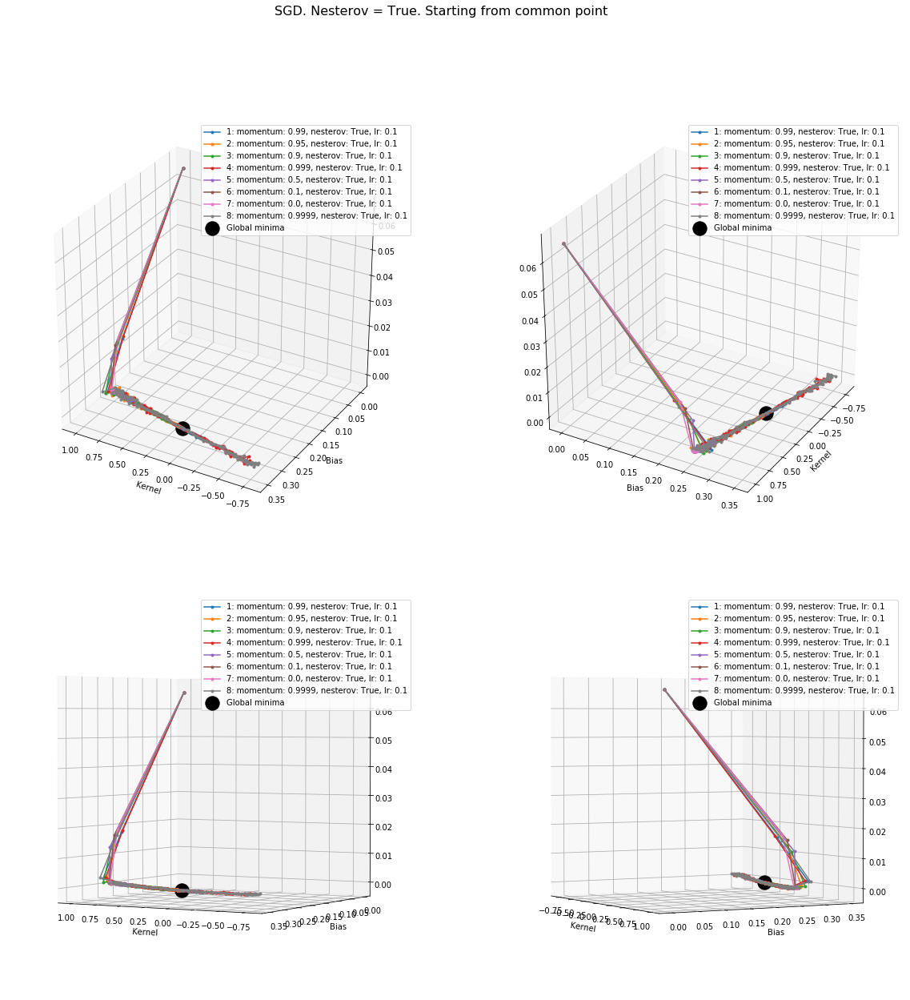

,Configuration,a,b,Prediction for 0.0,Prediction for 1.0,Final MSE
0,"momentum: 0.99, nesterov: True, lr: 0.1",0.103379,0.299814,0.299814,0.403193,8.481547e-09
1,"momentum: 0.95, nesterov: True, lr: 0.1",0.126676,0.298665,0.298665,0.425341,6.769588e-07
2,"momentum: 0.9, nesterov: True, lr: 0.1",0.271333,0.291133,0.291133,0.562466,2.536754e-05
3,"momentum: 0.999, nesterov: True, lr: 0.1",0.557845,0.275303,0.275303,0.833149,2.032383e-04
4,"momentum: 0.5, nesterov: True, lr: 0.1",0.751138,0.267645,0.267645,1.018783,3.578057e-04
5,"momentum: 0.1, nesterov: True, lr: 0.1",0.858644,0.262860,0.262860,1.121503,4.875927e-04
6,"momentum: 0.0, nesterov: True, lr: 0.1",0.872289,0.264081,0.264081,1.136371,5.093396e-04
7,"momentum: 0.9999, nesterov: True, lr: 0.1",0.881998,0.268281,0.268281,1.150279,5.477965e-04


In [72]:
plot_training(histories['SGD. Nesterov = True. Ones'], 'SGD. Nesterov = True. Starting from common point')
# plot_training(histories['SGD. Nesterov = True. Default'], 'SGD. Nesterov = True. Default initialization')

## Nesterov: True vs False

In [73]:
configs = [
    {'momentum': 0.9, 'nesterov': False, 'lr': 0.1 },
    {'momentum': 0.95, 'nesterov': False, 'lr': 0.1 },
    {'momentum': 0.99, 'nesterov': False, 'lr': 0.1 },
    {'momentum': 0.999, 'nesterov': False, 'lr': 0.1 },
    {'momentum': 0.9999, 'nesterov': False, 'lr': 0.1 },
    {'momentum': 0.9, 'nesterov': True, 'lr': 0.1 },
    {'momentum': 0.95, 'nesterov': True, 'lr': 0.1 },
    {'momentum': 0.99, 'nesterov': True, 'lr': 0.1 },
    {'momentum': 0.999, 'nesterov': True, 'lr': 0.1 },
    {'momentum': 0.9999, 'nesterov': True, 'lr': 0.1 },
]

histories['SGD. Nesterov: True vs False. Ones'] = train(configs, 'sgd', 'ones')
# histories['SGD. Nesterov: True vs False. Default'] = train(configs, 'sgd')

Training config {'momentum': 0.9, 'nesterov': False, 'lr': 0.1}
Prediction for 0.: 0.2915, should be 0.3
Prediction for 0.1: 0.5568, should be 0.4
MSE: 2.7275710090179926e-05

Training config {'momentum': 0.95, 'nesterov': False, 'lr': 0.1}
Prediction for 0.: 0.2989, should be 0.3
Prediction for 0.1: 0.4251, should be 0.4
MSE: 9.737965029898987e-07

Training config {'momentum': 0.99, 'nesterov': False, 'lr': 0.1}
Prediction for 0.: 0.2985, should be 0.3
Prediction for 0.1: 0.3995, should be 0.4
MSE: 1.5855073641546368e-06

Training config {'momentum': 0.999, 'nesterov': False, 'lr': 0.1}
Prediction for 0.: 0.1350, should be 0.3
Prediction for 0.1: 0.9351, should be 0.4
MSE: 0.01043896030751057

Training config {'momentum': 0.9999, 'nesterov': False, 'lr': 0.1}
Prediction for 0.: 0.1711, should be 0.3
Prediction for 0.1: 0.4585, should be 0.4
MSE: 0.00774604802718386

Training config {'momentum': 0.9, 'nesterov': True, 'lr': 0.1}
Prediction for 0.: 0.2914, should be 0.3
Prediction for 0

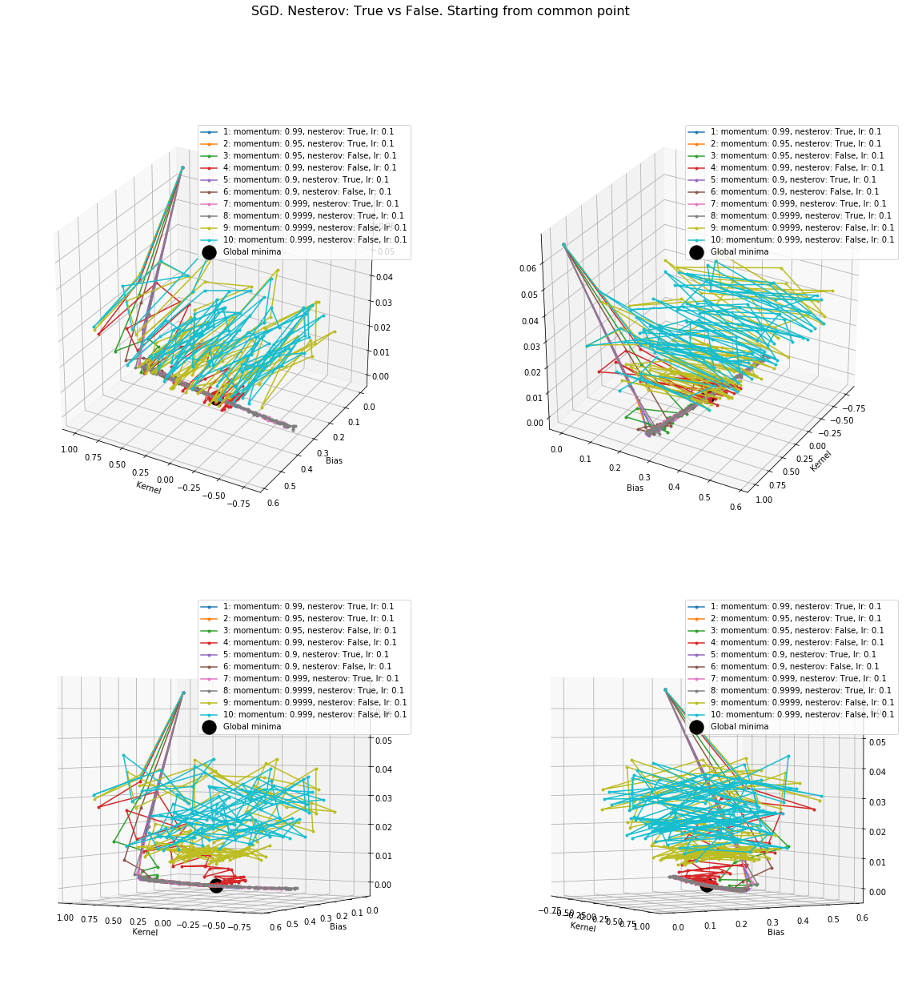

,Configuration,a,b,Prediction for 0.0,Prediction for 1.0,Final MSE
0,"momentum: 0.99, nesterov: True, lr: 0.1",0.103530,0.299805,0.299805,0.403335,9.604809e-09
1,"momentum: 0.95, nesterov: True, lr: 0.1",0.126799,0.298420,0.298420,0.425219,6.519668e-07
2,"momentum: 0.95, nesterov: False, lr: 0.1",0.126117,0.298941,0.298941,0.425058,9.737965e-07
3,"momentum: 0.99, nesterov: False, lr: 0.1",0.101019,0.298456,0.298456,0.399475,1.585507e-06
4,"momentum: 0.9, nesterov: True, lr: 0.1",0.267860,0.291391,0.291391,0.559250,2.528244e-05
5,"momentum: 0.9, nesterov: False, lr: 0.1",0.265350,0.291492,0.291492,0.556842,2.727571e-05
6,"momentum: 0.999, nesterov: True, lr: 0.1",0.566459,0.271836,0.271836,0.838295,2.042576e-04
7,"momentum: 0.9999, nesterov: True, lr: 0.1",0.815482,0.254028,0.254028,1.069510,4.740644e-04
8,"momentum: 0.9999, nesterov: False, lr: 0.1",0.287447,0.171057,0.171057,0.458503,7.746048e-03
9,"momentum: 0.999, nesterov: False, lr: 0.1",0.800061,0.135020,0.135020,0.935081,1.043896e-02


In [74]:
plot_training(histories['SGD. Nesterov: True vs False. Ones'], 'SGD. Nesterov: True vs False. Starting from common point')
# plot_training(histories['SGD. Nesterov: True vs False. Default'], 'SGD. Nesterov: True vs False. Default initialization')

# AdaGrad

In [75]:
configs = [
    {'lr': 0.1 },
    {'lr': 0.01 },
    {'lr': 0.001 },
    {'lr': 0.2 },
]

histories['AdaGrad. Ones'] = train(configs, 'Adagrad', 'ones')
# histories['AdaGrad. Default'] = train(configs, 'Adagrad')

Training config {'lr': 0.1}
Prediction for 0.: 0.2996, should be 0.3
Prediction for 0.1: 0.4072, should be 0.4
MSE: 5.139975485235482e-08

Training config {'lr': 0.01}
Prediction for 0.: 0.2471, should be 0.3
Prediction for 0.1: 1.3895, should be 0.4
MSE: 0.0009085012483410537

Training config {'lr': 0.001}
Prediction for 0.: 0.0589, should be 0.3
Prediction for 0.1: 1.1166, should be 0.4
MSE: 0.03836242593824864

Training config {'lr': 0.2}
Prediction for 0.: 0.3000, should be 0.3
Prediction for 0.1: 0.4000, should be 0.4
MSE: 6.687983580810073e-15

------------------------------


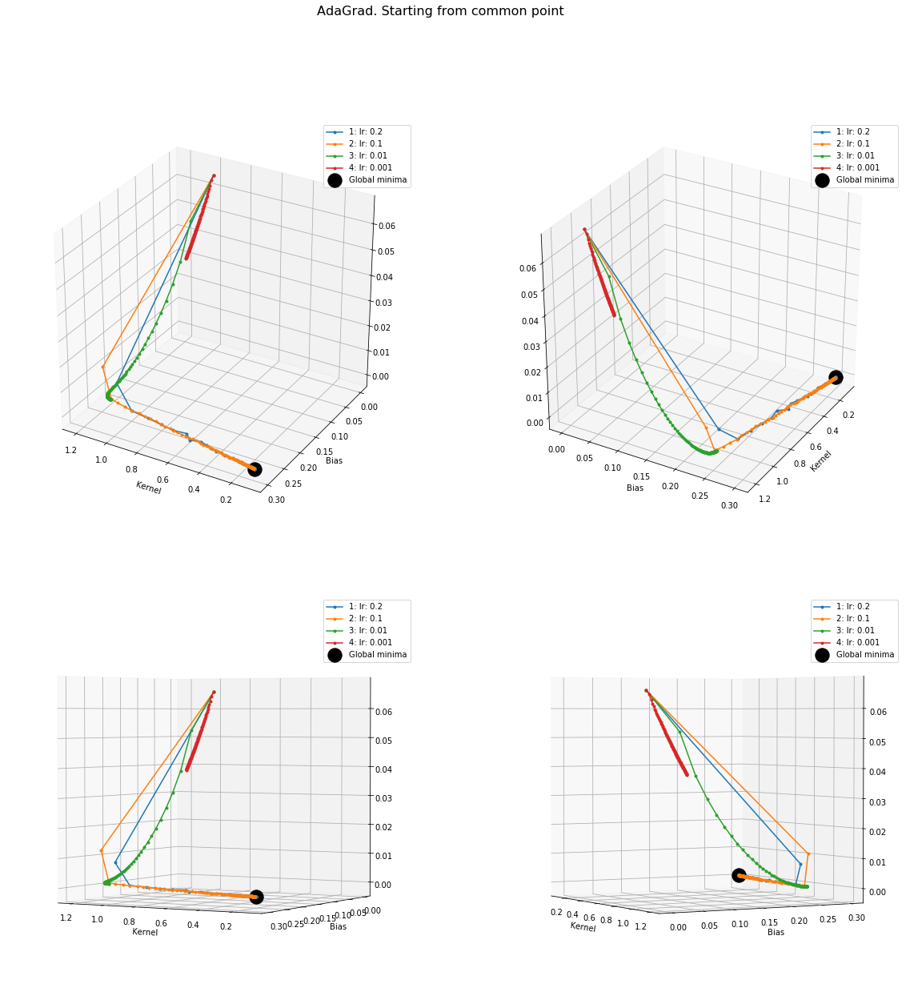

,Configuration,a,b,Prediction for 0.0,Prediction for 1.0,Final MSE
0,lr: 0.2,0.100003,0.300000,0.300000,0.400002,6.687984e-15
1,lr: 0.1,0.107583,0.299635,0.299635,0.407218,5.139975e-08
2,lr: 0.01,1.142442,0.247074,0.247074,1.389516,9.085012e-04
3,lr: 0.001,1.057770,0.058852,0.058852,1.116622,3.836243e-02


In [76]:
plot_training(histories['AdaGrad. Ones'], 'AdaGrad. Starting from common point')
# plot_training(histories['AdaGrad. Default'], 'AdaGrad. Default initialization')

# RMSProp
## Learning rate

In [77]:
configs = [
    {'rho': 0.9, 'lr': 0.1 },
    {'rho': 0.9, 'lr': 0.05 },
    {'rho': 0.9, 'lr': 0.01 },
    {'rho': 0.9, 'lr': 0.001 },
]

histories['RMSProp. Learning rate. ones'] = train(configs, 'rmsp', 'ones')
# histories['RMSProp. Learning rate. Default'] = train(configs, 'rmsp')

Training config {'rho': 0.9, 'lr': 0.1}
Prediction for 0.: 0.2574, should be 0.3
Prediction for 0.1: 0.3466, should be 0.4
MSE: 0.0029488845262676477

Training config {'rho': 0.9, 'lr': 0.05}
Prediction for 0.: 0.2721, should be 0.3
Prediction for 0.1: 0.2974, should be 0.4
MSE: 0.0006919584673596546

Training config {'rho': 0.9, 'lr': 0.01}
Prediction for 0.: 0.3043, should be 0.3
Prediction for 0.1: 0.4062, should be 0.4
MSE: 3.0137641624605747e-05

Training config {'rho': 0.9, 'lr': 0.001}
Prediction for 0.: 0.2753, should be 0.3
Prediction for 0.1: 0.8503, should be 0.4
MSE: 0.00019616983481682838

------------------------------


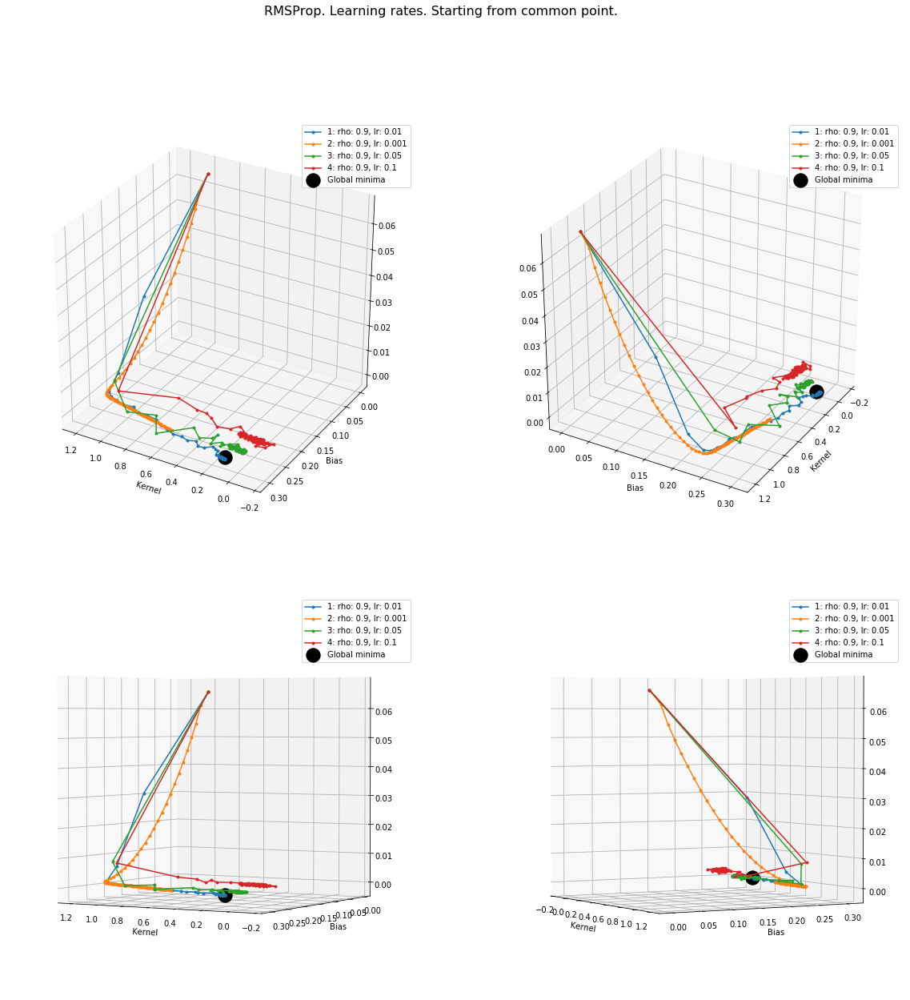

,Configuration,a,b,Prediction for 0.0,Prediction for 1.0,Final MSE
0,"rho: 0.9, lr: 0.01",0.101874,0.304340,0.304340,0.406215,0.000030
1,"rho: 0.9, lr: 0.001",0.574967,0.275309,0.275309,0.850276,0.000196
2,"rho: 0.9, lr: 0.05",0.025310,0.272068,0.272068,0.297377,0.000692
3,"rho: 0.9, lr: 0.1",0.089202,0.257437,0.257437,0.346638,0.002949


In [78]:
plot_training(histories['RMSProp. Learning rate. ones'], 'RMSProp. Learning rates. Starting from common point.')
# plot_training(histories['RMSProp. Learning rate. Default'], 'RMSProp. Learning rates. Default initialization.')

## RHO

In [79]:
configs = [
    {'rho': 0.0, 'lr': 0.01 },
    {'rho': 0.1, 'lr': 0.01 },
    {'rho': 0.5, 'lr': 0.01 },
    {'rho': 0.95, 'lr': 0.01 },
    {'rho': 0.9, 'lr': 0.01 },
    {'rho': 0.99, 'lr': 0.01 },
    {'rho': 0.999, 'lr': 0.01 },
    {'rho': 0.9999, 'lr': 0.01 },
]

histories['RMSProp. RHO. Ones'] = train(configs, 'rmsp', 'ones')
# histories['RMSProp. RHO. Default'] = train(configs, 'rmsp')

Training config {'rho': 0.0, 'lr': 0.01}
Prediction for 0.: 0.3000, should be 0.3
Prediction for 0.1: 0.5190, should be 0.4
MSE: 3.398227145225974e-05

Training config {'rho': 0.1, 'lr': 0.01}
Prediction for 0.: 0.2950, should be 0.3
Prediction for 0.1: 0.3892, should be 0.4
MSE: 2.753192875388777e-05

Training config {'rho': 0.5, 'lr': 0.01}
Prediction for 0.: 0.3050, should be 0.3
Prediction for 0.1: 0.4045, should be 0.4
MSE: 2.7553920699574518e-05

Training config {'rho': 0.95, 'lr': 0.01}
Prediction for 0.: 0.2951, should be 0.3
Prediction for 0.1: 0.3869, should be 0.4
MSE: 2.5887055926432367e-05

Training config {'rho': 0.9, 'lr': 0.01}
Prediction for 0.: 0.2950, should be 0.3
Prediction for 0.1: 0.3880, should be 0.4
MSE: 2.6923731275019237e-05

Training config {'rho': 0.99, 'lr': 0.01}
Prediction for 0.: 0.3041, should be 0.3
Prediction for 0.1: 0.4073, should be 0.4
MSE: 1.749671391735319e-05

Training config {'rho': 0.999, 'lr': 0.01}
Prediction for 0.: 0.3000, should be 0.3

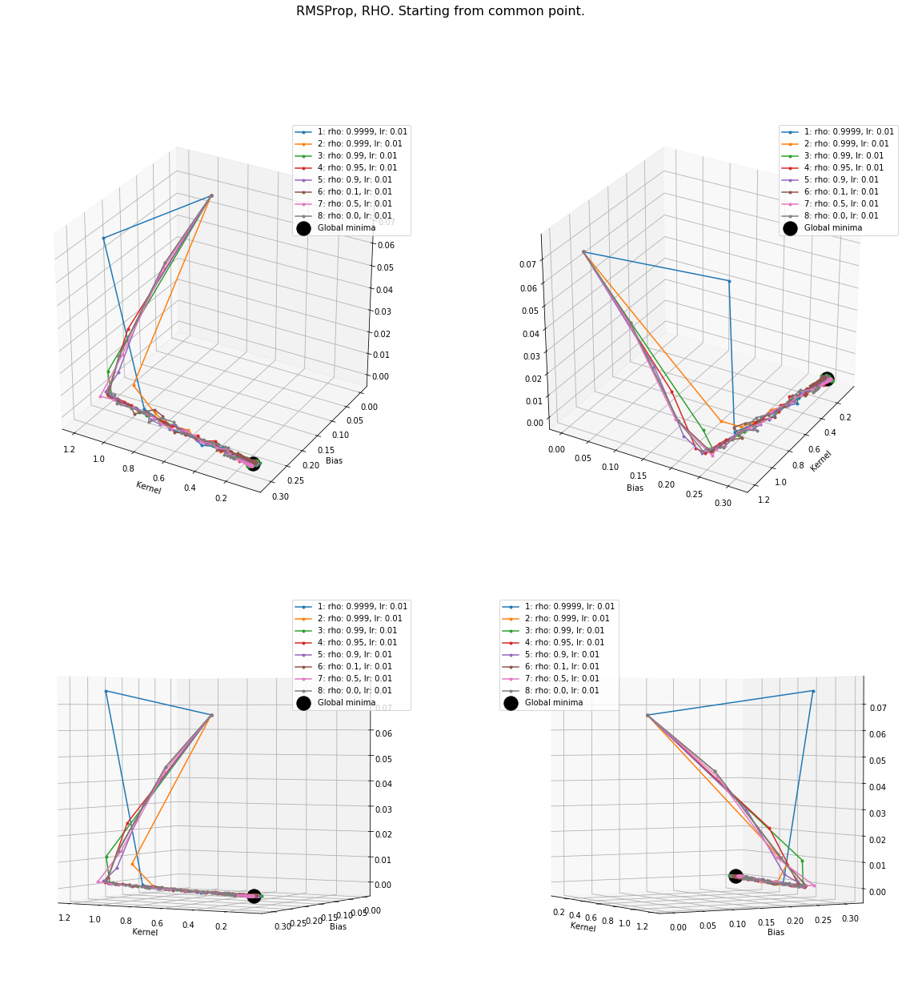

,Configuration,a,b,Prediction for 0.0,Prediction for 1.0,Final MSE
0,"rho: 0.9999, lr: 0.01",0.100000,0.300000,0.300000,0.400000,2.309264e-16
1,"rho: 0.999, lr: 0.01",0.100000,0.300000,0.300000,0.400000,4.529710e-16
2,"rho: 0.99, lr: 0.01",0.103172,0.304106,0.304106,0.407278,1.749671e-05
3,"rho: 0.95, lr: 0.01",0.091766,0.295117,0.295117,0.386883,2.588706e-05
4,"rho: 0.9, lr: 0.01",0.093070,0.294960,0.294960,0.388030,2.692373e-05
5,"rho: 0.1, lr: 0.01",0.094219,0.294955,0.294955,0.389173,2.753193e-05
6,"rho: 0.5, lr: 0.01",0.099522,0.304990,0.304990,0.404511,2.755392e-05
7,"rho: 0.0, lr: 0.01",0.218982,0.299992,0.299992,0.518974,3.398227e-05


In [80]:
plot_training(histories['RMSProp. RHO. Ones'], 'RMSProp, RHO. Starting from common point.')
# plot_training(histories['RMSProp. RHO. Default'], 'RMSProp, RHO. Default initialization.')

# AdaDelta
## Learning Rates

In [81]:
configs = [
    {'rho': 0.95, 'lr': 2.0 },
    {'rho': 0.95, 'lr': 1.0 },
    {'rho': 0.95, 'lr': 0.1 },
    {'rho': 0.95, 'lr': 0.01 },
]

histories['AdaDelta. Learning Rates. Ones'] = train(configs, 'Adadelta', 'ones')
# histories['AdaDelta. Learning Rates. Default'] = train(configs, 'Adadelta')

Training config {'rho': 0.95, 'lr': 2.0}
Prediction for 0.: 0.2912, should be 0.3
Prediction for 0.1: 0.5864, should be 0.4
MSE: 3.496830777294235e-05

Training config {'rho': 0.95, 'lr': 1.0}
Prediction for 0.: 0.2717, should be 0.3
Prediction for 0.1: 0.9443, should be 0.4
MSE: 0.000278522570442874

Training config {'rho': 0.95, 'lr': 0.1}
Prediction for 0.: 0.1576, should be 0.3
Prediction for 0.1: 1.3100, should be 0.4
MSE: 0.009225054550915957

Training config {'rho': 0.95, 'lr': 0.01}
Prediction for 0.: 0.0209, should be 0.3
Prediction for 0.1: 1.0400, should be 0.4
MSE: 0.05534856282174587

------------------------------


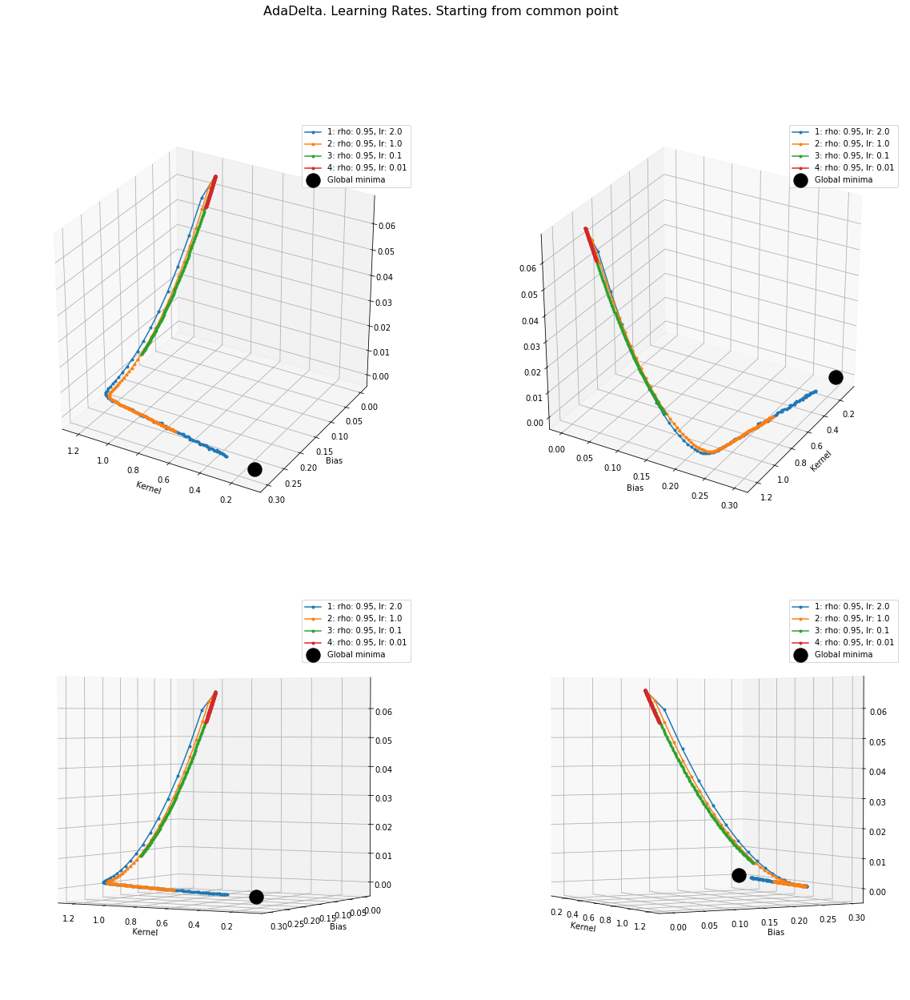

,Configuration,a,b,Prediction for 0.0,Prediction for 1.0,Final MSE
0,"rho: 0.95, lr: 2.0",0.295196,0.291191,0.291191,0.586387,0.000035
1,"rho: 0.95, lr: 1.0",0.672616,0.271671,0.271671,0.944287,0.000279
2,"rho: 0.95, lr: 0.1",1.152416,0.157608,0.157608,1.310024,0.009225
3,"rho: 0.95, lr: 0.01",1.019085,0.020888,0.020888,1.039973,0.055349


In [82]:
plot_training(histories['AdaDelta. Learning Rates. Ones'], 'AdaDelta. Learning Rates. Starting from common point')
# plot_training(histories['AdaDelta. Learning Rates. Default'], 'AdaDelta. Learning Rates. Default initialization')

## RHO

In [83]:
configs = [
    {'rho': 0.1, 'lr': 2.0 },
    {'rho': 0.5, 'lr': 2.0 },
    {'rho': 0.9, 'lr': 2.0 },
    {'rho': 0.95, 'lr': 2.0 },
    {'rho': 0.99, 'lr': 2.0 },
    {'rho': 0.999, 'lr': 2.0 },
    {'rho': 0.9999, 'lr': 2.0 },
]

histories['AdaDelta. RHO. Ones'] = train(configs, 'Adadelta', 'ones')
# histories['AdaDelta. RHO. Default'] = train(configs, 'Adadelta')

Training config {'rho': 0.1, 'lr': 2.0}
Prediction for 0.: 0.2874, should be 0.3
Prediction for 0.1: 0.6478, should be 0.4
MSE: 6.120697071310133e-05

Training config {'rho': 0.5, 'lr': 2.0}
Prediction for 0.: 0.2874, should be 0.3
Prediction for 0.1: 0.6632, should be 0.4
MSE: 6.66552601614967e-05

Training config {'rho': 0.9, 'lr': 2.0}
Prediction for 0.: 0.2888, should be 0.3
Prediction for 0.1: 0.5712, should be 0.4
MSE: 3.0150583370414097e-05

Training config {'rho': 0.95, 'lr': 2.0}
Prediction for 0.: 0.2887, should be 0.3
Prediction for 0.1: 0.5811, should be 0.4
MSE: 3.4127807157346976e-05

Training config {'rho': 0.99, 'lr': 2.0}
Prediction for 0.: 0.2771, should be 0.3
Prediction for 0.1: 0.8378, should be 0.4
MSE: 0.000183982789167203

Training config {'rho': 0.999, 'lr': 2.0}
Prediction for 0.: 0.2866, should be 0.3
Prediction for 0.1: 0.6514, should be 0.4
MSE: 6.004260685585905e-05

Training config {'rho': 0.9999, 'lr': 2.0}
Prediction for 0.: 0.2974, should be 0.3
Predic

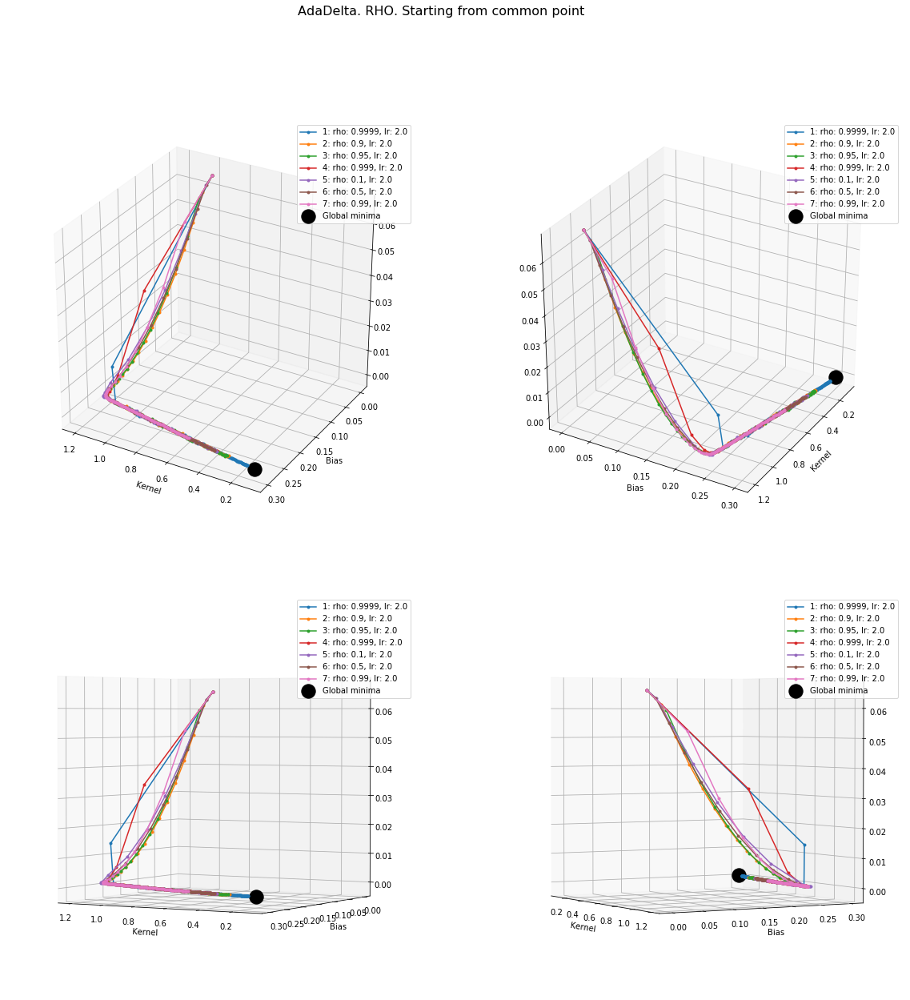

,Configuration,a,b,Prediction for 0.0,Prediction for 1.0,Final MSE
0,"rho: 0.9999, lr: 2.0",0.150883,0.297419,0.297419,0.448302,0.000002
1,"rho: 0.9, lr: 2.0",0.282378,0.288774,0.288774,0.571152,0.000030
2,"rho: 0.95, lr: 2.0",0.292342,0.288724,0.288724,0.581066,0.000034
3,"rho: 0.999, lr: 2.0",0.364824,0.286597,0.286597,0.651421,0.000060
4,"rho: 0.1, lr: 2.0",0.360424,0.287415,0.287415,0.647839,0.000061
5,"rho: 0.5, lr: 2.0",0.375716,0.287439,0.287439,0.663155,0.000067
6,"rho: 0.99, lr: 2.0",0.560686,0.277092,0.277092,0.837778,0.000184


In [84]:
plot_training(histories['AdaDelta. RHO. Ones'], 'AdaDelta. RHO. Starting from common point')
# plot_training(histories['AdaDelta. RHO. Default'], 'AdaDelta. RHO. Default initialization')

# Adam
## Learning rate

In [85]:
configs = [
    {'amsgrad': False, 'lr': 0.001, 'beta_1': 0.9, 'beta_2': 0.999 },
    {'amsgrad': False, 'lr': 0.01, 'beta_1': 0.9, 'beta_2': 0.999 },
    {'amsgrad': False, 'lr': 0.1, 'beta_1': 0.9, 'beta_2': 0.999 },
    
]

histories['Adam. Learning rate. Ones'] = train(configs, 'adam', 'ones')
# histories['Adam. Learning rate. Default'] = train(configs, 'adam')

Training config {'amsgrad': False, 'lr': 0.001, 'beta_1': 0.9, 'beta_2': 0.999}
Prediction for 0.: 0.2504, should be 0.3
Prediction for 0.1: 1.3345, should be 0.4
MSE: 0.0008102030784357339

Training config {'amsgrad': False, 'lr': 0.01, 'beta_1': 0.9, 'beta_2': 0.999}
Prediction for 0.: 0.2997, should be 0.3
Prediction for 0.1: 0.4049, should be 0.4
MSE: 2.6170298639272006e-08

Training config {'amsgrad': False, 'lr': 0.1, 'beta_1': 0.9, 'beta_2': 0.999}
Prediction for 0.: 0.3000, should be 0.3
Prediction for 0.1: 0.4000, should be 0.4
MSE: 4.618527844644633e-16

------------------------------


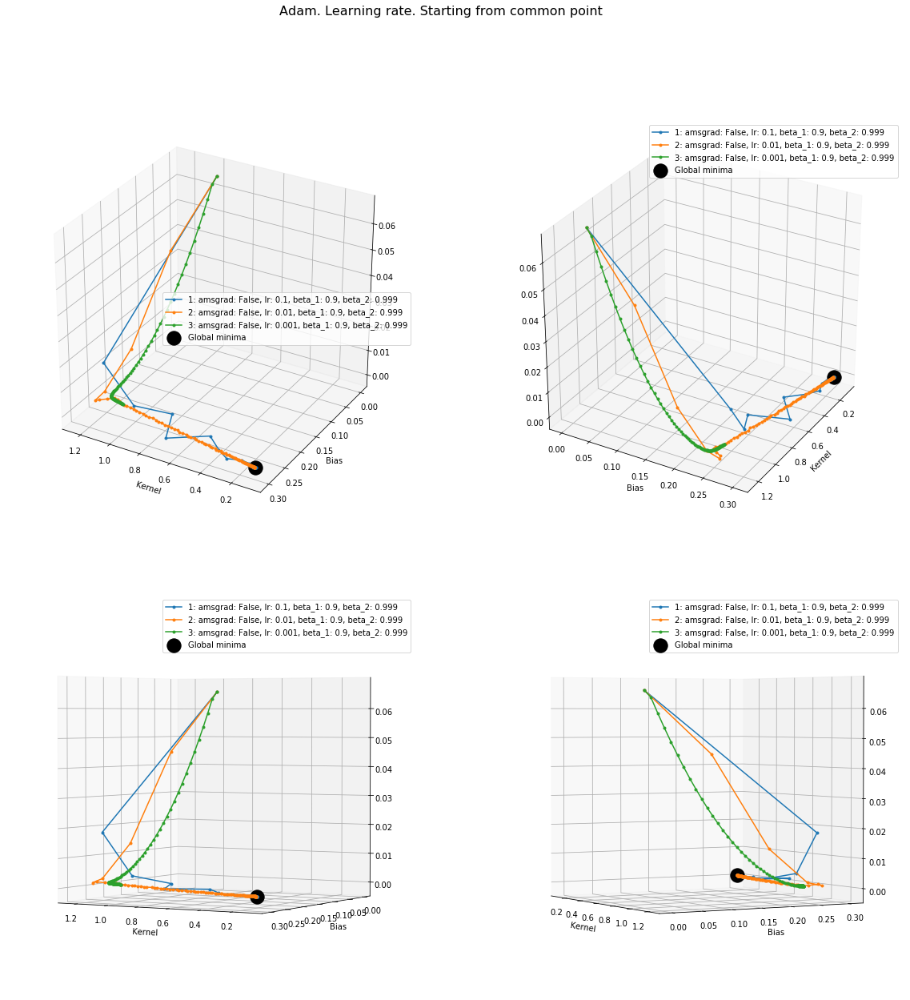

,Configuration,a,b,Prediction for 0.0,Prediction for 1.0,Final MSE
0,"amsgrad: False, lr: 0.1, beta_1: 0.9, beta_2: ...",0.100000,0.300000,0.300000,0.400000,4.618528e-16
1,"amsgrad: False, lr: 0.01, beta_1: 0.9, beta_2:...",0.105216,0.299725,0.299725,0.404941,2.617030e-08
2,"amsgrad: False, lr: 0.001, beta_1: 0.9, beta_2...",1.084020,0.250431,0.250431,1.334450,8.102031e-04


In [86]:
plot_training(histories['Adam. Learning rate. Ones'], 'Adam. Learning rate. Starting from common point')
# plot_training(histories['Adam. Learning rate. Default'], 'Adam. Learning rate. Default initialization')

## beta_1

In [87]:
configs = [
    {'amsgrad': False, 'lr': 0.1, 'beta_1': 0.999, 'beta_2': 0.999 },
    {'amsgrad': False, 'lr': 0.1, 'beta_1': 0.99, 'beta_2': 0.999 },
    {'amsgrad': False, 'lr': 0.1, 'beta_1': 0.95, 'beta_2': 0.999 },
    {'amsgrad': False, 'lr': 0.1, 'beta_1': 0.9, 'beta_2': 0.999 },
    {'amsgrad': False, 'lr': 0.1, 'beta_1': 0.5, 'beta_2': 0.999 },

]

histories['Adam. beta_1. Ones'] = train(configs, 'adam', 'ones')
# histories['Adam. beta_1. Default'] = train(configs, 'adam')

Training config {'amsgrad': False, 'lr': 0.1, 'beta_1': 0.999, 'beta_2': 0.999}
Prediction for 0.: 0.2801, should be 0.3
Prediction for 0.1: 0.0309, should be 0.4
MSE: 0.002365659619681537

Training config {'amsgrad': False, 'lr': 0.1, 'beta_1': 0.99, 'beta_2': 0.999}
Prediction for 0.: 0.2996, should be 0.3
Prediction for 0.1: 0.4078, should be 0.4
MSE: 8.0700414457624e-07

Training config {'amsgrad': False, 'lr': 0.1, 'beta_1': 0.95, 'beta_2': 0.999}
Prediction for 0.: 0.3000, should be 0.3
Prediction for 0.1: 0.4000, should be 0.4
MSE: 1.4477308291404623e-15

Training config {'amsgrad': False, 'lr': 0.1, 'beta_1': 0.9, 'beta_2': 0.999}
Prediction for 0.: 0.3000, should be 0.3
Prediction for 0.1: 0.4000, should be 0.4
MSE: 4.529709935176683e-16

Training config {'amsgrad': False, 'lr': 0.1, 'beta_1': 0.5, 'beta_2': 0.999}
Prediction for 0.: 0.3001, should be 0.3
Prediction for 0.1: 0.4106, should be 0.4
MSE: 2.306346877389842e-06

------------------------------


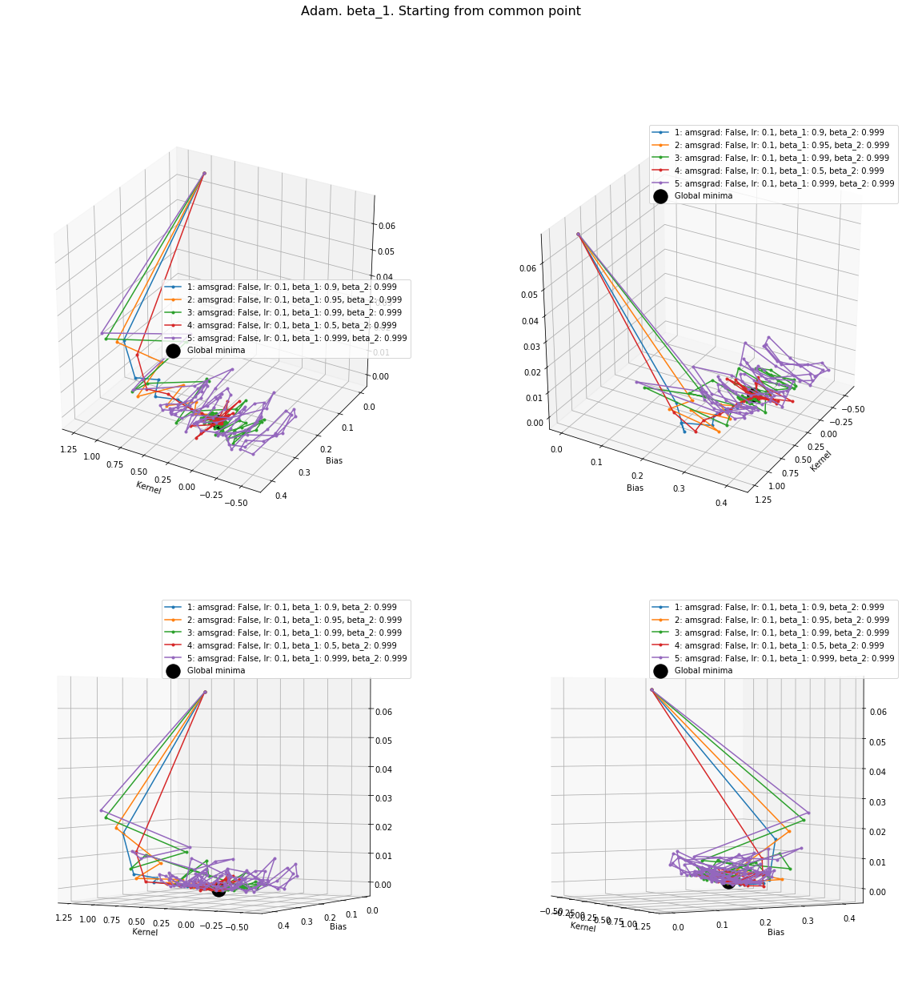

,Configuration,a,b,Prediction for 0.0,Prediction for 1.0,Final MSE
0,"amsgrad: False, lr: 0.1, beta_1: 0.9, beta_2: ...",0.100000,0.300000,0.300000,0.400000,4.529710e-16
1,"amsgrad: False, lr: 0.1, beta_1: 0.95, beta_2:...",0.100000,0.300000,0.300000,0.400000,1.447731e-15
2,"amsgrad: False, lr: 0.1, beta_1: 0.99, beta_2:...",0.108214,0.299614,0.299614,0.407828,8.070041e-07
3,"amsgrad: False, lr: 0.1, beta_1: 0.5, beta_2: ...",0.110526,0.300113,0.300113,0.410639,2.306347e-06
4,"amsgrad: False, lr: 0.1, beta_1: 0.999, beta_2...",-0.249216,0.280145,0.280145,0.030929,2.365660e-03


In [88]:
plot_training(histories['Adam. beta_1. Ones'], 'Adam. beta_1. Starting from common point')
# plot_training(histories['Adam. beta_1. Default'], 'Adam. beta_1. Default initialization')

## beta_2

In [89]:
configs = [
    {'amsgrad': False, 'lr': 0.1, 'beta_1': 0.9, 'beta_2': 0.9999 },
    {'amsgrad': False, 'lr': 0.1, 'beta_1': 0.9, 'beta_2': 0.999 },
    {'amsgrad': False, 'lr': 0.1, 'beta_1': 0.9, 'beta_2': 0.95 },
    {'amsgrad': False, 'lr': 0.1, 'beta_1': 0.9, 'beta_2': 0.9 },
]

histories['Adam. beta_2. Ones'] = train(configs, 'adam', 'ones')
# histories['Adam. beta_2. Default'] = train(configs, 'adam')

Training config {'amsgrad': False, 'lr': 0.1, 'beta_1': 0.9, 'beta_2': 0.9999}
Prediction for 0.: 0.3000, should be 0.3
Prediction for 0.1: 0.4000, should be 0.4
MSE: 4.973799211201194e-16

Training config {'amsgrad': False, 'lr': 0.1, 'beta_1': 0.9, 'beta_2': 0.999}
Prediction for 0.: 0.3000, should be 0.3
Prediction for 0.1: 0.4000, should be 0.4
MSE: 3.9968029415901227e-16

Training config {'amsgrad': False, 'lr': 0.1, 'beta_1': 0.9, 'beta_2': 0.95}
Prediction for 0.: 0.3001, should be 0.3
Prediction for 0.1: 0.4260, should be 0.4
MSE: 8.016005756417144e-06

Training config {'amsgrad': False, 'lr': 0.1, 'beta_1': 0.9, 'beta_2': 0.9}
Prediction for 0.: 0.2983, should be 0.3
Prediction for 0.1: 0.4012, should be 0.4
MSE: 1.0515895507978711e-05

------------------------------


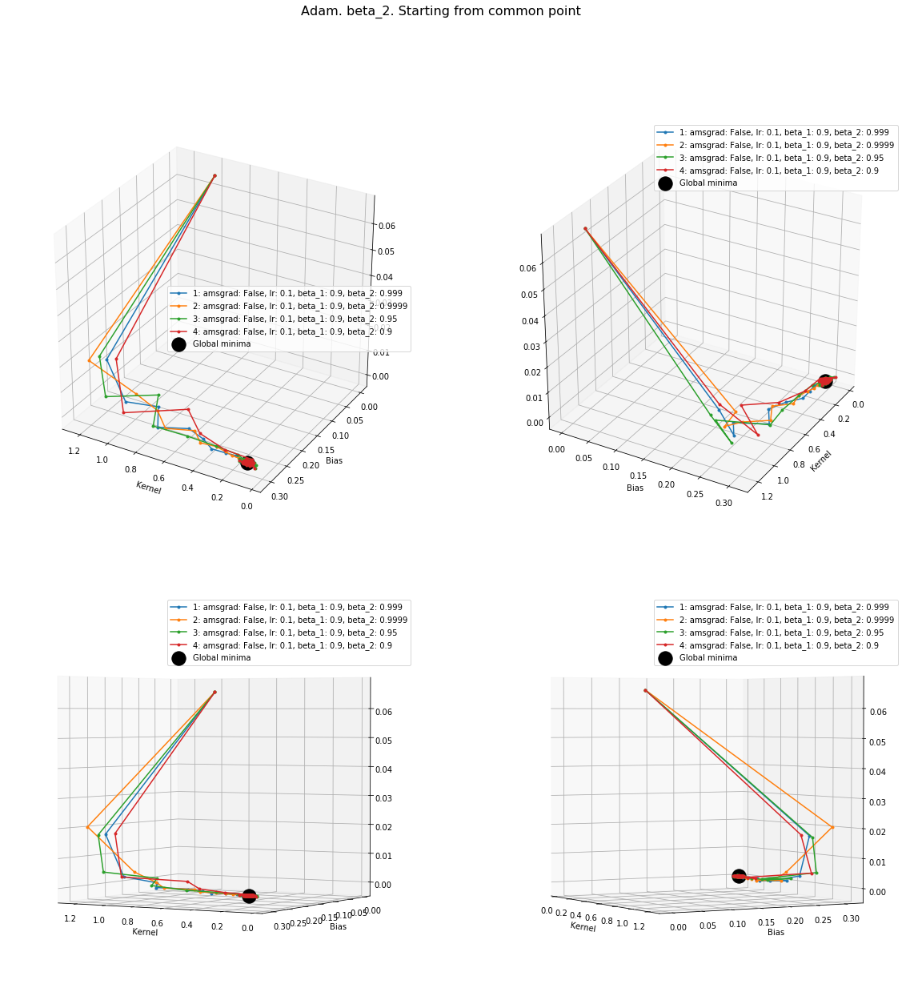

,Configuration,a,b,Prediction for 0.0,Prediction for 1.0,Final MSE
0,"amsgrad: False, lr: 0.1, beta_1: 0.9, beta_2: ...",0.100000,0.300000,0.300000,0.400000,3.996803e-16
1,"amsgrad: False, lr: 0.1, beta_1: 0.9, beta_2: ...",0.100000,0.300000,0.300000,0.400000,4.973799e-16
2,"amsgrad: False, lr: 0.1, beta_1: 0.9, beta_2: ...",0.125939,0.300096,0.300096,0.426035,8.016006e-06
3,"amsgrad: False, lr: 0.1, beta_1: 0.9, beta_2: 0.9",0.102828,0.298346,0.298346,0.401174,1.051590e-05


In [90]:
plot_training(histories['Adam. beta_2. Ones'], 'Adam. beta_2. Starting from common point')
# plot_training(histories['Adam. beta_2. Default'], 'Adam. beta_2. Default initialization')

## beta_1 and beta_2 combined

In [91]:
configs = [
    {'amsgrad': False, 'lr': 0.1, 'beta_1': 0.9, 'beta_2': 0.9999 },
    {'amsgrad': False, 'lr': 0.1, 'beta_1': 0.9, 'beta_2': 0.999 },
    {'amsgrad': False, 'lr': 0.1, 'beta_1': 0.95, 'beta_2': 0.9999 },
    {'amsgrad': False, 'lr': 0.1, 'beta_1': 0.95, 'beta_2': 0.999 },
    {'amsgrad': False, 'lr': 0.1, 'beta_1': 0.99, 'beta_2': 0.9999 },
    {'amsgrad': False, 'lr': 0.1, 'beta_1': 0.99, 'beta_2': 0.999 },
]

histories['Adam. beta_1 and beta_2. Ones'] = train(configs, 'adam', 'ones')
# histories['Adam. beta_1 and beta_2. Default'] = train(configs, 'adam')

Training config {'amsgrad': False, 'lr': 0.1, 'beta_1': 0.9, 'beta_2': 0.9999}
Prediction for 0.: 0.3000, should be 0.3
Prediction for 0.1: 0.4000, should be 0.4
MSE: 1.4210854688732225e-15

Training config {'amsgrad': False, 'lr': 0.1, 'beta_1': 0.9, 'beta_2': 0.999}
Prediction for 0.: 0.3000, should be 0.3
Prediction for 0.1: 0.4000, should be 0.4
MSE: 4.0856207517964e-16

Training config {'amsgrad': False, 'lr': 0.1, 'beta_1': 0.95, 'beta_2': 0.9999}
Prediction for 0.: 0.3000, should be 0.3
Prediction for 0.1: 0.4000, should be 0.4
MSE: 1.243449812726466e-16

Training config {'amsgrad': False, 'lr': 0.1, 'beta_1': 0.95, 'beta_2': 0.999}
Prediction for 0.: 0.3000, should be 0.3
Prediction for 0.1: 0.4000, should be 0.4
MSE: 1.1812772899955349e-15

Training config {'amsgrad': False, 'lr': 0.1, 'beta_1': 0.99, 'beta_2': 0.9999}
Prediction for 0.: 0.2996, should be 0.3
Prediction for 0.1: 0.4059, should be 0.4
MSE: 8.011421371634242e-07

Training config {'amsgrad': False, 'lr': 0.1, 'be

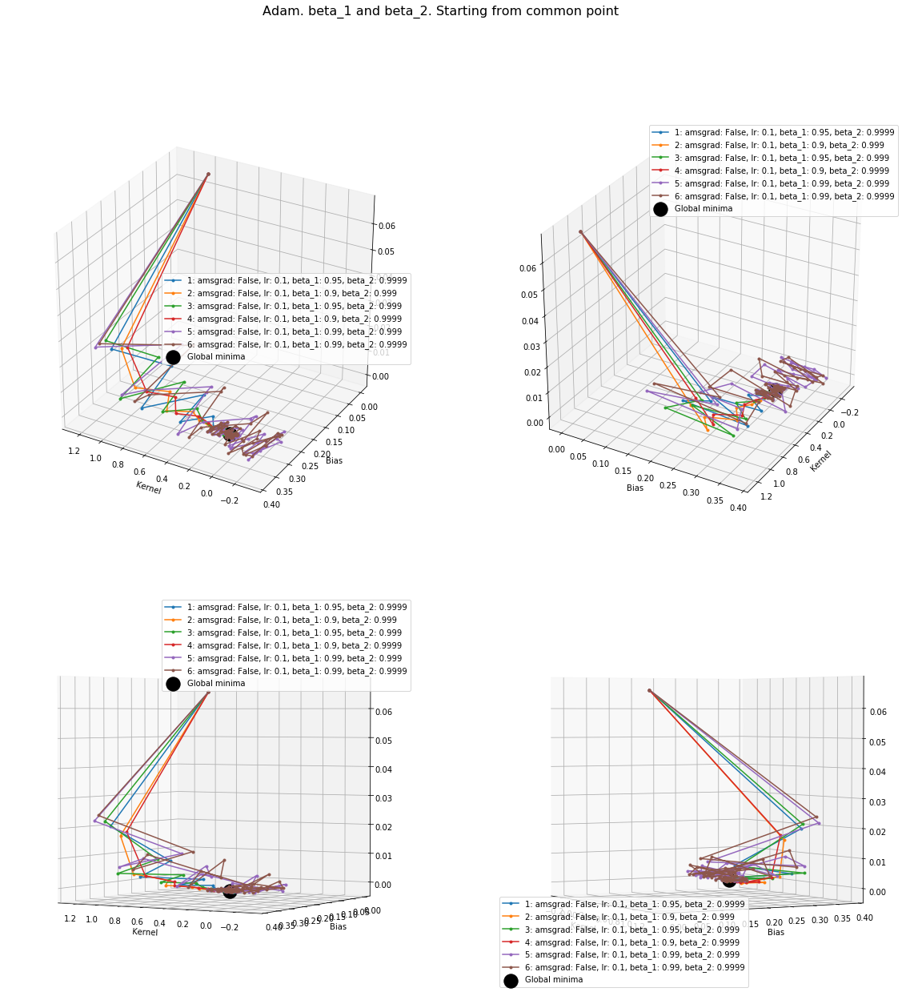

,Configuration,a,b,Prediction for 0.0,Prediction for 1.0,Final MSE
0,"amsgrad: False, lr: 0.1, beta_1: 0.95, beta_2:...",0.100000,0.300000,0.300000,0.400000,1.243450e-16
1,"amsgrad: False, lr: 0.1, beta_1: 0.9, beta_2: ...",0.100000,0.300000,0.300000,0.400000,4.085621e-16
2,"amsgrad: False, lr: 0.1, beta_1: 0.95, beta_2:...",0.100000,0.300000,0.300000,0.400000,1.181277e-15
3,"amsgrad: False, lr: 0.1, beta_1: 0.9, beta_2: ...",0.100000,0.300000,0.300000,0.400000,1.421085e-15
4,"amsgrad: False, lr: 0.1, beta_1: 0.99, beta_2:...",0.103460,0.299798,0.299798,0.403258,7.180859e-07
5,"amsgrad: False, lr: 0.1, beta_1: 0.99, beta_2:...",0.106275,0.299646,0.299646,0.405921,8.011421e-07


In [92]:
plot_training(histories['Adam. beta_1 and beta_2. Ones'], 'Adam. beta_1 and beta_2. Starting from common point')
# plot_training(histories['Adam. beta_1 and beta_2. Default'], 'Adam. beta_1 and beta_2. Default initialization')

# AMSGrad
## Learning rate

In [93]:
configs = [
    {'amsgrad': True, 'lr': 0.001, 'beta_1': 0.9, 'beta_2': 0.999 },
    {'amsgrad': True, 'lr': 0.01, 'beta_1': 0.9, 'beta_2': 0.999 },
    {'amsgrad': True, 'lr': 0.1, 'beta_1': 0.9, 'beta_2': 0.999 },
]

histories['AMSGrad. Learning rate. Ones'] = train(configs, 'adam', 'ones')
# histories['AMSGrad. Learning rate. Default'] = train(configs, 'adam')

Training config {'amsgrad': True, 'lr': 0.001, 'beta_1': 0.9, 'beta_2': 0.999}
Prediction for 0.: 0.2492, should be 0.3
Prediction for 0.1: 1.3579, should be 0.4
MSE: 0.0008507587306667119

Training config {'amsgrad': True, 'lr': 0.01, 'beta_1': 0.9, 'beta_2': 0.999}
Prediction for 0.: 0.2992, should be 0.3
Prediction for 0.1: 0.4150, should be 0.4
MSE: 2.279616012401675e-07

Training config {'amsgrad': True, 'lr': 0.1, 'beta_1': 0.9, 'beta_2': 0.999}
Prediction for 0.: 0.3000, should be 0.3
Prediction for 0.1: 0.4000, should be 0.4
MSE: 3.9079850916791763e-16

------------------------------


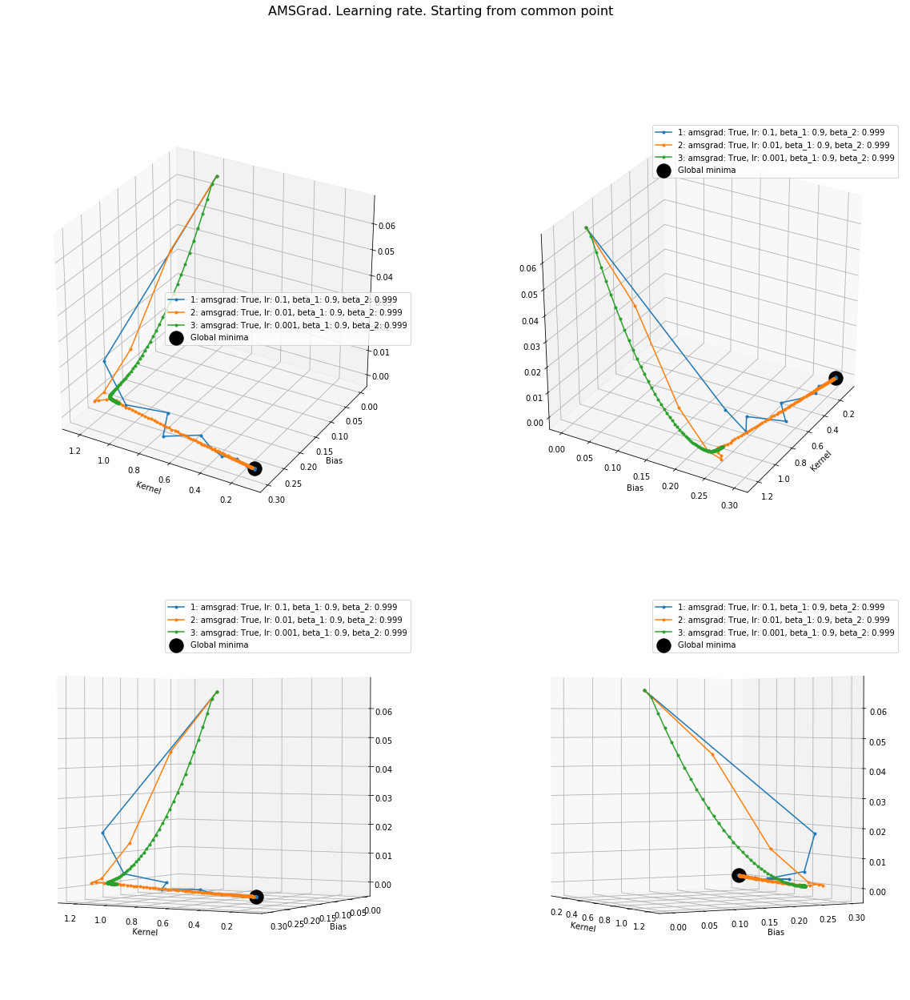

,Configuration,a,b,Prediction for 0.0,Prediction for 1.0,Final MSE
0,"amsgrad: True, lr: 0.1, beta_1: 0.9, beta_2: 0...",0.100000,0.300000,0.300000,0.400000,3.907985e-16
1,"amsgrad: True, lr: 0.01, beta_1: 0.9, beta_2: ...",0.115829,0.299191,0.299191,0.415020,2.279616e-07
2,"amsgrad: True, lr: 0.001, beta_1: 0.9, beta_2:...",1.108741,0.249156,0.249156,1.357897,8.507587e-04


In [94]:
plot_training(histories['AMSGrad. Learning rate. Ones'], 'AMSGrad. Learning rate. Starting from common point')
# plot_training(histories['AMSGrad. Learning rate. Default'], 'AMSGrad. Learning rate. Default initialization')

## beta_1

In [95]:
configs = [
    {'amsgrad': True, 'lr': 0.1, 'beta_1': 0.999, 'beta_2': 0.999 },
    {'amsgrad': True, 'lr': 0.1, 'beta_1': 0.99, 'beta_2': 0.999 },
    {'amsgrad': True, 'lr': 0.1, 'beta_1': 0.95, 'beta_2': 0.999 },
    {'amsgrad': True, 'lr': 0.1, 'beta_1': 0.9, 'beta_2': 0.999 },
    {'amsgrad': True, 'lr': 0.1, 'beta_1': 0.5, 'beta_2': 0.999 },
]

histories['AMSGrad. beta_1. Ones'] = train(configs, 'adam', 'ones')
# histories['AMSGrad. beta_1. Default'] = train(configs, 'adam')

Training config {'amsgrad': True, 'lr': 0.1, 'beta_1': 0.999, 'beta_2': 0.999}
Prediction for 0.: 0.2907, should be 0.3
Prediction for 0.1: 0.0933, should be 0.4
MSE: 0.0014371214609127491

Training config {'amsgrad': True, 'lr': 0.1, 'beta_1': 0.99, 'beta_2': 0.999}
Prediction for 0.: 0.2992, should be 0.3
Prediction for 0.1: 0.4049, should be 0.4
MSE: 2.578485381654616e-07

Training config {'amsgrad': True, 'lr': 0.1, 'beta_1': 0.95, 'beta_2': 0.999}
Prediction for 0.: 0.3000, should be 0.3
Prediction for 0.1: 0.4000, should be 0.4
MSE: 5.506706191552865e-16

Training config {'amsgrad': True, 'lr': 0.1, 'beta_1': 0.9, 'beta_2': 0.999}
Prediction for 0.: 0.3000, should be 0.3
Prediction for 0.1: 0.4000, should be 0.4
MSE: 5.062617034642361e-16

Training config {'amsgrad': True, 'lr': 0.1, 'beta_1': 0.5, 'beta_2': 0.999}
Prediction for 0.: 0.2997, should be 0.3
Prediction for 0.1: 0.3990, should be 0.4
MSE: 3.091279374700662e-08

------------------------------


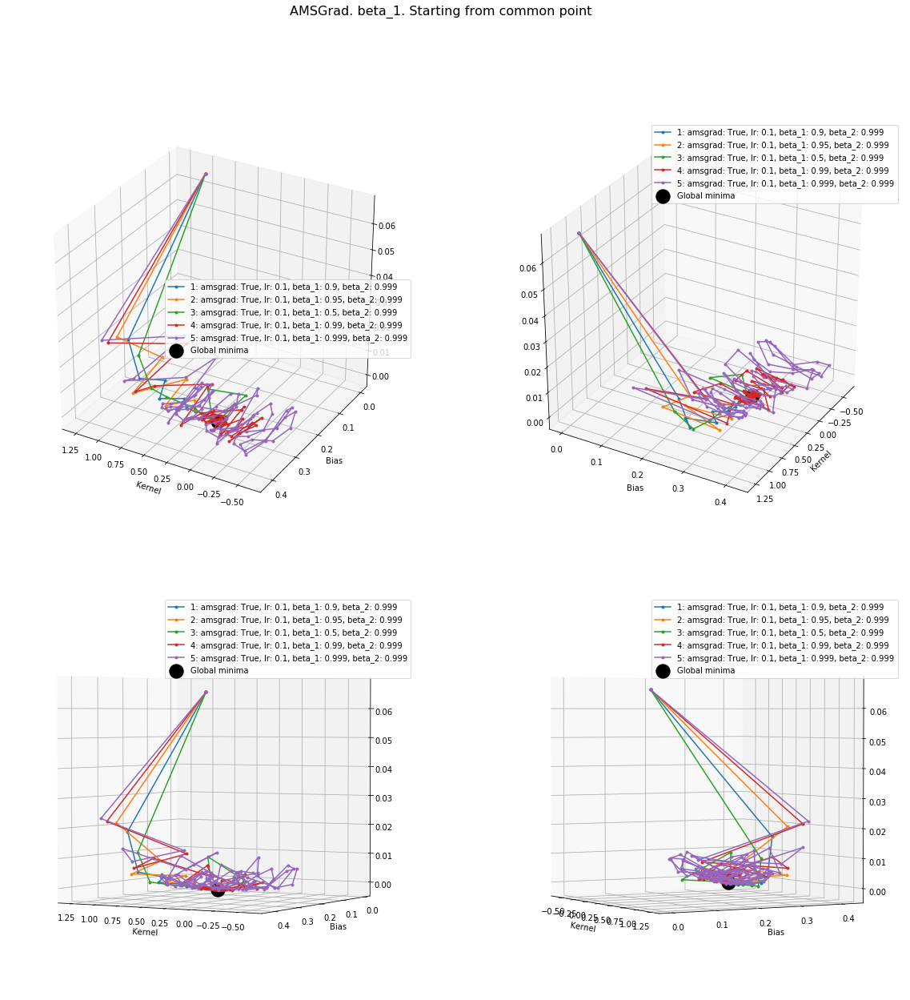

,Configuration,a,b,Prediction for 0.0,Prediction for 1.0,Final MSE
0,"amsgrad: True, lr: 0.1, beta_1: 0.9, beta_2: 0...",0.100000,0.300000,0.300000,0.400000,5.062617e-16
1,"amsgrad: True, lr: 0.1, beta_1: 0.95, beta_2: ...",0.100000,0.300000,0.300000,0.400000,5.506706e-16
2,"amsgrad: True, lr: 0.1, beta_1: 0.5, beta_2: 0...",0.099327,0.299652,0.299652,0.398979,3.091279e-08
3,"amsgrad: True, lr: 0.1, beta_1: 0.99, beta_2: ...",0.105653,0.299206,0.299206,0.404859,2.578485e-07
4,"amsgrad: True, lr: 0.1, beta_1: 0.999, beta_2:...",-0.197385,0.290654,0.290654,0.093269,1.437121e-03


In [96]:
plot_training(histories['AMSGrad. beta_1. Ones'], 'AMSGrad. beta_1. Starting from common point')
# plot_training(histories['AMSGrad. beta_1. Default'], 'AMSGrad. beta_1. Default initialization')

## beta_2

In [97]:
configs = [
    {'amsgrad': True, 'lr': 0.1, 'beta_1': 0.9, 'beta_2': 0.9999 },
    {'amsgrad': True, 'lr': 0.1, 'beta_1': 0.9, 'beta_2': 0.999 },
    {'amsgrad': True, 'lr': 0.1, 'beta_1': 0.9, 'beta_2': 0.95 },
    {'amsgrad': True, 'lr': 0.1, 'beta_1': 0.9, 'beta_2': 0.9 },
]

histories['AMSGrad. beta_2. Ones'] = train(configs, 'adam', 'ones')
# histories['AMSGrad. beta_2. Default'] = train(configs, 'adam')

Training config {'amsgrad': True, 'lr': 0.1, 'beta_1': 0.9, 'beta_2': 0.9999}
Prediction for 0.: 0.3000, should be 0.3
Prediction for 0.1: 0.4000, should be 0.4
MSE: 5.417888381346588e-16

Training config {'amsgrad': True, 'lr': 0.1, 'beta_1': 0.9, 'beta_2': 0.999}
Prediction for 0.: 0.3000, should be 0.3
Prediction for 0.1: 0.4000, should be 0.4
MSE: 5.0626171140517e-16

Training config {'amsgrad': True, 'lr': 0.1, 'beta_1': 0.9, 'beta_2': 0.95}
Prediction for 0.: 0.3000, should be 0.3
Prediction for 0.1: 0.4000, should be 0.4
MSE: 2.3980817755419857e-16

Training config {'amsgrad': True, 'lr': 0.1, 'beta_1': 0.9, 'beta_2': 0.9}
Prediction for 0.: 0.3000, should be 0.3
Prediction for 0.1: 0.4000, should be 0.4
MSE: 2.39808178215943e-16

------------------------------


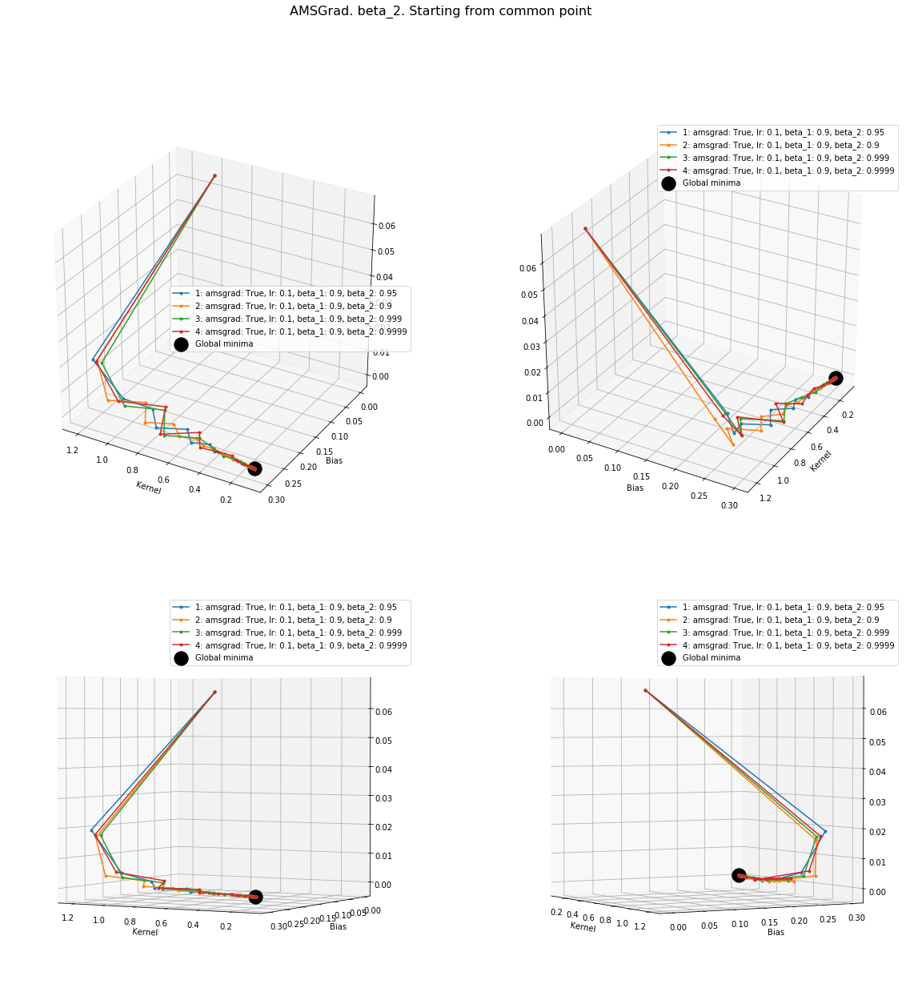

,Configuration,a,b,Prediction for 0.0,Prediction for 1.0,Final MSE
0,"amsgrad: True, lr: 0.1, beta_1: 0.9, beta_2: 0.95",0.1,0.3,0.3,0.4,2.398082e-16
1,"amsgrad: True, lr: 0.1, beta_1: 0.9, beta_2: 0.9",0.1,0.3,0.3,0.4,2.398082e-16
2,"amsgrad: True, lr: 0.1, beta_1: 0.9, beta_2: 0...",0.1,0.3,0.3,0.4,5.062617e-16
3,"amsgrad: True, lr: 0.1, beta_1: 0.9, beta_2: 0...",0.1,0.3,0.3,0.4,5.417888e-16


In [98]:
plot_training(histories['AMSGrad. beta_2. Ones'], 'AMSGrad. beta_2. Starting from common point')
# plot_training(histories['AMSGrad. beta_2. Default'], 'AMSGrad. beta_2. Default initialization')

## beta_1 and beta_2 combined

In [99]:
configs = [
    {'amsgrad': True, 'lr': 0.1, 'beta_1': 0.9, 'beta_2': 0.9999 },
    {'amsgrad': True, 'lr': 0.1, 'beta_1': 0.9, 'beta_2': 0.999 },
    {'amsgrad': True, 'lr': 0.1, 'beta_1': 0.95, 'beta_2': 0.9999 },
    {'amsgrad': True, 'lr': 0.1, 'beta_1': 0.95, 'beta_2': 0.999 },
    {'amsgrad': True, 'lr': 0.1, 'beta_1': 0.99, 'beta_2': 0.9999 },
    {'amsgrad': True, 'lr': 0.1, 'beta_1': 0.99, 'beta_2': 0.999 },
]

histories['AMSGrad. beta_1 and beta_2. Ones'] = train(configs, 'adam', 'ones')
# histories['AMSGrad. beta_1 and beta_2. Default'] = train(configs, 'adam')

Training config {'amsgrad': True, 'lr': 0.1, 'beta_1': 0.9, 'beta_2': 0.9999}
Prediction for 0.: 0.3000, should be 0.3
Prediction for 0.1: 0.4000, should be 0.4
MSE: 1.1901590670456956e-15

Training config {'amsgrad': True, 'lr': 0.1, 'beta_1': 0.9, 'beta_2': 0.999}
Prediction for 0.: 0.3000, should be 0.3
Prediction for 0.1: 0.4000, should be 0.4
MSE: 4.2632564582357376e-16

Training config {'amsgrad': True, 'lr': 0.1, 'beta_1': 0.95, 'beta_2': 0.9999}
Prediction for 0.: 0.3000, should be 0.3
Prediction for 0.1: 0.4000, should be 0.4
MSE: 5.329070491730972e-16

Training config {'amsgrad': True, 'lr': 0.1, 'beta_1': 0.95, 'beta_2': 0.999}
Prediction for 0.: 0.3000, should be 0.3
Prediction for 0.1: 0.4000, should be 0.4
MSE: 4.3520743544687984e-16

Training config {'amsgrad': True, 'lr': 0.1, 'beta_1': 0.99, 'beta_2': 0.9999}
Prediction for 0.: 0.3006, should be 0.3
Prediction for 0.1: 0.4070, should be 0.4
MSE: 3.9691257818219584e-07

Training config {'amsgrad': True, 'lr': 0.1, 'beta

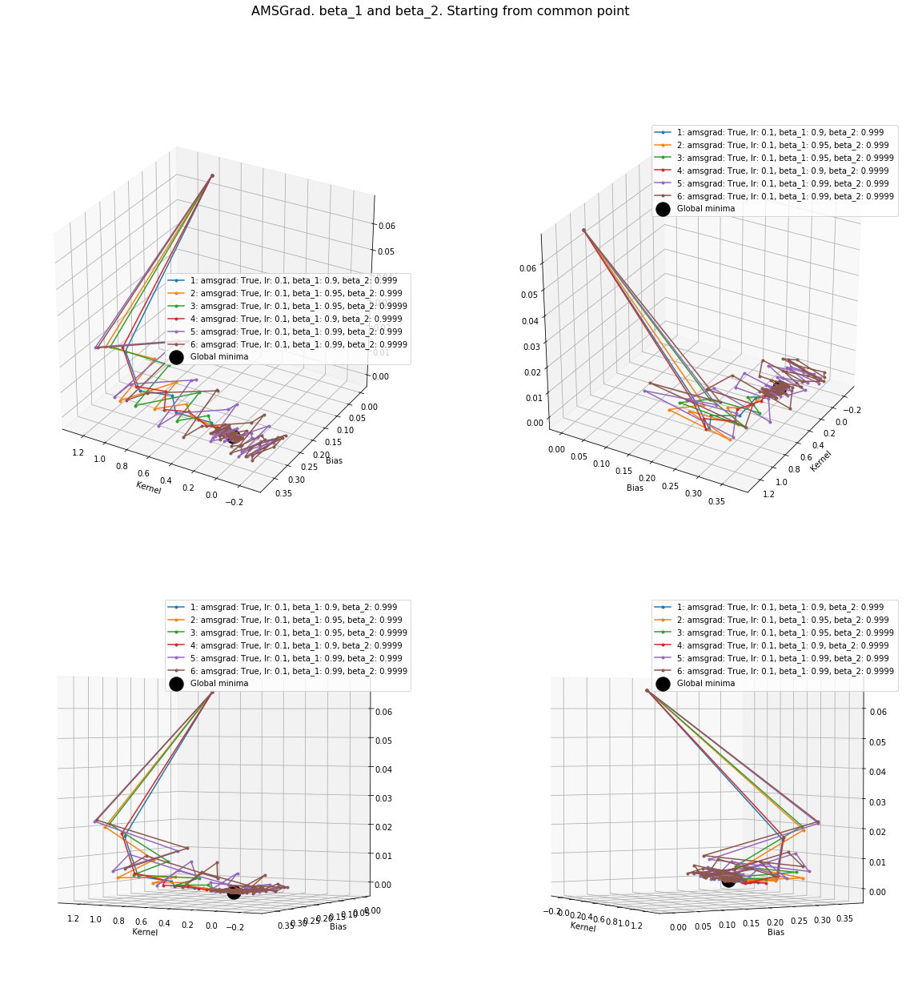

,Configuration,a,b,Prediction for 0.0,Prediction for 1.0,Final MSE
0,"amsgrad: True, lr: 0.1, beta_1: 0.9, beta_2: 0...",0.100000,0.300000,0.300000,0.400000,4.263256e-16
1,"amsgrad: True, lr: 0.1, beta_1: 0.95, beta_2: ...",0.100000,0.300000,0.300000,0.400000,4.352074e-16
2,"amsgrad: True, lr: 0.1, beta_1: 0.95, beta_2: ...",0.100000,0.300000,0.300000,0.400000,5.329070e-16
3,"amsgrad: True, lr: 0.1, beta_1: 0.9, beta_2: 0...",0.100000,0.300000,0.300000,0.400000,1.190159e-15
4,"amsgrad: True, lr: 0.1, beta_1: 0.99, beta_2: ...",0.104030,0.300706,0.300706,0.404736,3.220323e-07
5,"amsgrad: True, lr: 0.1, beta_1: 0.99, beta_2: ...",0.106401,0.300570,0.300570,0.406971,3.969126e-07


In [100]:
plot_training(histories['AMSGrad. beta_1 and beta_2. Ones'], 'AMSGrad. beta_1 and beta_2. Starting from common point')
# plot_training(histories['AMSGrad. beta_1 and beta_2. Default'], 'AMSGrad. beta_1 and beta_2. Default initialization')

# AdaMax
## Learning Rates

In [101]:
configs = [
    {'lr': 0.002, 'beta_1': 0.9, 'beta_2': 0.999 },
    {'lr': 0.001, 'beta_1': 0.9, 'beta_2': 0.999 },
    {'lr': 0.01, 'beta_1': 0.9, 'beta_2': 0.999 },
    {'lr': 0.05, 'beta_1': 0.9, 'beta_2': 0.999 },
    {'lr': 0.1, 'beta_1': 0.9, 'beta_2': 0.999 },
]

histories['AdaMax. Learning rates. Ones'] = train(configs, 'Adamax', 'ones')
# histories['AdaMax. Learning rates. Default'] = train(configs, 'Adamax')

Training config {'lr': 0.002, 'beta_1': 0.9, 'beta_2': 0.999}
Prediction for 0.: 0.2535, should be 0.3
Prediction for 0.1: 1.2787, should be 0.4
MSE: 0.0007165248622186482

Training config {'lr': 0.001, 'beta_1': 0.9, 'beta_2': 0.999}
Prediction for 0.: 0.2487, should be 0.3
Prediction for 0.1: 1.3673, should be 0.4
MSE: 0.0008670001872815192

Training config {'lr': 0.01, 'beta_1': 0.9, 'beta_2': 0.999}
Prediction for 0.: 0.2812, should be 0.3
Prediction for 0.1: 0.7557, should be 0.4
MSE: 0.00011969547485932708

Training config {'lr': 0.05, 'beta_1': 0.9, 'beta_2': 0.999}
Prediction for 0.: 0.2997, should be 0.3
Prediction for 0.1: 0.4053, should be 0.4
MSE: 2.9604819928863435e-08

Training config {'lr': 0.1, 'beta_1': 0.9, 'beta_2': 0.999}
Prediction for 0.: 0.3000, should be 0.3
Prediction for 0.1: 0.4000, should be 0.4
MSE: 3.2951419286171353e-15

------------------------------


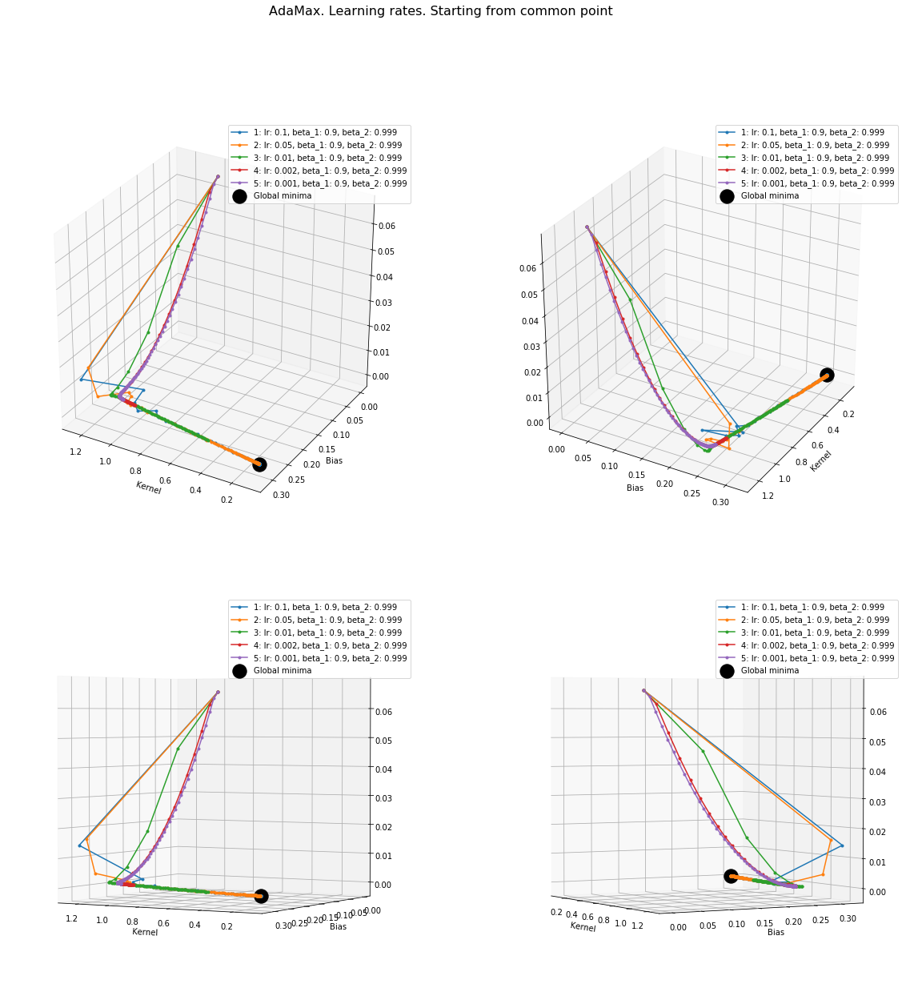

,Configuration,a,b,Prediction for 0.0,Prediction for 1.0,Final MSE
0,"lr: 0.1, beta_1: 0.9, beta_2: 0.999",0.100001,0.300000,0.300000,0.400001,3.295142e-15
1,"lr: 0.05, beta_1: 0.9, beta_2: 0.999",0.105627,0.299693,0.299693,0.405320,2.960482e-08
2,"lr: 0.01, beta_1: 0.9, beta_2: 0.999",0.474507,0.281207,0.281207,0.755714,1.196955e-04
3,"lr: 0.002, beta_1: 0.9, beta_2: 0.999",1.025183,0.253493,0.253493,1.278677,7.165249e-04
4,"lr: 0.001, beta_1: 0.9, beta_2: 0.999",1.118546,0.248732,0.248732,1.367278,8.670002e-04


In [102]:
plot_training(histories['AdaMax. Learning rates. Ones'], 'AdaMax. Learning rates. Starting from common point')
# plot_training(histories['AdaMax. Learning rates. Default'], 'AdaMax. Learning rates. Default initialization')

## beta_1

In [103]:
configs = [
    {'lr': 0.02, 'beta_1': 0.9999, 'beta_2': 0.999 },
    {'lr': 0.02, 'beta_1': 0.999, 'beta_2': 0.999 },
    {'lr': 0.02, 'beta_1': 0.99, 'beta_2': 0.999 },
    {'lr': 0.02, 'beta_1': 0.95, 'beta_2': 0.999 },
    {'lr': 0.02, 'beta_1': 0.9, 'beta_2': 0.999 },
    {'lr': 0.02, 'beta_1': 0.5, 'beta_2': 0.999 },
    {'lr': 0.02, 'beta_1': 0.1, 'beta_2': 0.999 },
]

histories['AdaMax. beta_1. Ones'] = train(configs, 'Adamax', 'ones')
# histories['AdaMax. beta_1. Default'] = train(configs, 'Adamax')

Training config {'lr': 0.02, 'beta_1': 0.9999, 'beta_2': 0.999}
Prediction for 0.: 0.3139, should be 0.3
Prediction for 0.1: 0.0138, should be 0.4
MSE: 0.00026257867430103945

Training config {'lr': 0.02, 'beta_1': 0.999, 'beta_2': 0.999}
Prediction for 0.: 0.3407, should be 0.3
Prediction for 0.1: 0.1147, should be 0.4
MSE: 0.000889866563375108

Training config {'lr': 0.02, 'beta_1': 0.99, 'beta_2': 0.999}
Prediction for 0.: 0.2993, should be 0.3
Prediction for 0.1: 0.4244, should be 0.4
MSE: 7.18160575274851e-07

Training config {'lr': 0.02, 'beta_1': 0.95, 'beta_2': 0.999}
Prediction for 0.: 0.2950, should be 0.3
Prediction for 0.1: 0.4933, should be 0.4
MSE: 8.40990387587226e-06

Training config {'lr': 0.02, 'beta_1': 0.9, 'beta_2': 0.999}
Prediction for 0.: 0.2935, should be 0.3
Prediction for 0.1: 0.5297, should be 0.4
MSE: 1.6493112525495235e-05

Training config {'lr': 0.02, 'beta_1': 0.5, 'beta_2': 0.999}
Prediction for 0.: 0.2950, should be 0.3
Prediction for 0.1: 0.4937, shou

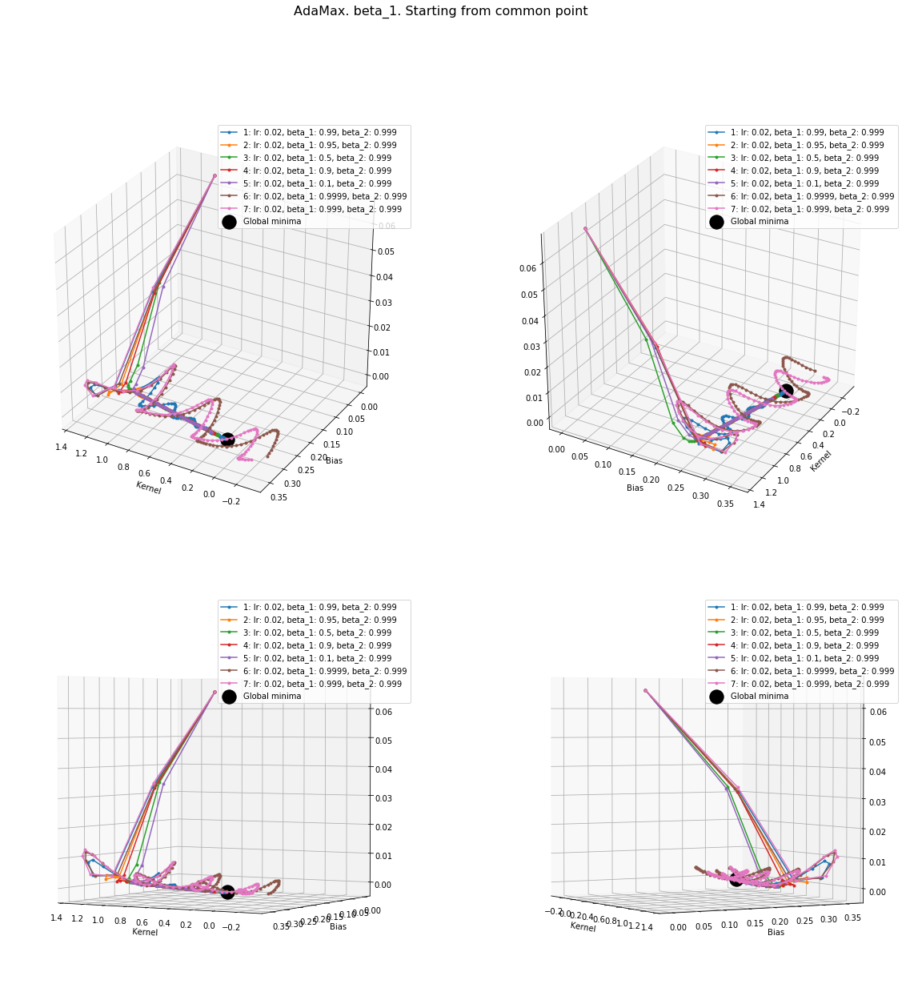

,Configuration,a,b,Prediction for 0.0,Prediction for 1.0,Final MSE
0,"lr: 0.02, beta_1: 0.99, beta_2: 0.999",0.125099,0.299269,0.299269,0.424367,7.181606e-07
1,"lr: 0.02, beta_1: 0.95, beta_2: 0.999",0.198241,0.295026,0.295026,0.493268,8.409904e-06
2,"lr: 0.02, beta_1: 0.5, beta_2: 0.999",0.198683,0.294997,0.294997,0.493680,8.571870e-06
3,"lr: 0.02, beta_1: 0.9, beta_2: 0.999",0.236284,0.293455,0.293455,0.529738,1.649311e-05
4,"lr: 0.02, beta_1: 0.1, beta_2: 0.999",0.265010,0.291606,0.291606,0.556616,2.386218e-05
5,"lr: 0.02, beta_1: 0.9999, beta_2: 0.999",-0.300043,0.313864,0.313864,0.013820,2.625787e-04
6,"lr: 0.02, beta_1: 0.999, beta_2: 0.999",-0.225974,0.340685,0.340685,0.114711,8.898666e-04


In [104]:
plot_training(histories['AdaMax. beta_1. Ones'], 'AdaMax. beta_1. Starting from common point')
# plot_training(histories['AdaMax. beta_1. Default'], 'AdaMax. beta_1. Default initialization')

## beta_2

In [105]:
configs = [
    {'lr': 0.02, 'beta_1': 0.9, 'beta_2': 0.9999 },
    {'lr': 0.02, 'beta_1': 0.9, 'beta_2': 0.999 },
    {'lr': 0.02, 'beta_1': 0.9, 'beta_2': 0.99 },
    {'lr': 0.02, 'beta_1': 0.9, 'beta_2': 0.95 },
    {'lr': 0.02, 'beta_1': 0.9, 'beta_2': 0.9 },
    {'lr': 0.02, 'beta_1': 0.9, 'beta_2': 0.5 },
]

histories['AdaMax. beta_2. Ones'] = train(configs, 'Adamax', 'ones')
# histories['AdaMax. beta_2. Default'] = train(configs, 'Adamax')

Training config {'lr': 0.02, 'beta_1': 0.9, 'beta_2': 0.9999}
Prediction for 0.: 0.2860, should be 0.3
Prediction for 0.1: 0.6693, should be 0.4
MSE: 6.84175429341849e-05

Training config {'lr': 0.02, 'beta_1': 0.9, 'beta_2': 0.999}
Prediction for 0.: 0.2951, should be 0.3
Prediction for 0.1: 0.4912, should be 0.4
MSE: 8.101952380457078e-06

Training config {'lr': 0.02, 'beta_1': 0.9, 'beta_2': 0.99}
Prediction for 0.: 0.3002, should be 0.3
Prediction for 0.1: 0.4010, should be 0.4
MSE: 1.8305624456260715e-07

Training config {'lr': 0.02, 'beta_1': 0.9, 'beta_2': 0.95}
Prediction for 0.: 0.2996, should be 0.3
Prediction for 0.1: 0.3999, should be 0.4
MSE: 3.0431721942392187e-07

Training config {'lr': 0.02, 'beta_1': 0.9, 'beta_2': 0.9}
Prediction for 0.: 0.2998, should be 0.3
Prediction for 0.1: 0.4012, should be 0.4
MSE: 6.617377228512745e-07

Training config {'lr': 0.02, 'beta_1': 0.9, 'beta_2': 0.5}
Prediction for 0.: 0.3180, should be 0.3
Prediction for 0.1: 0.4495, should be 0.4


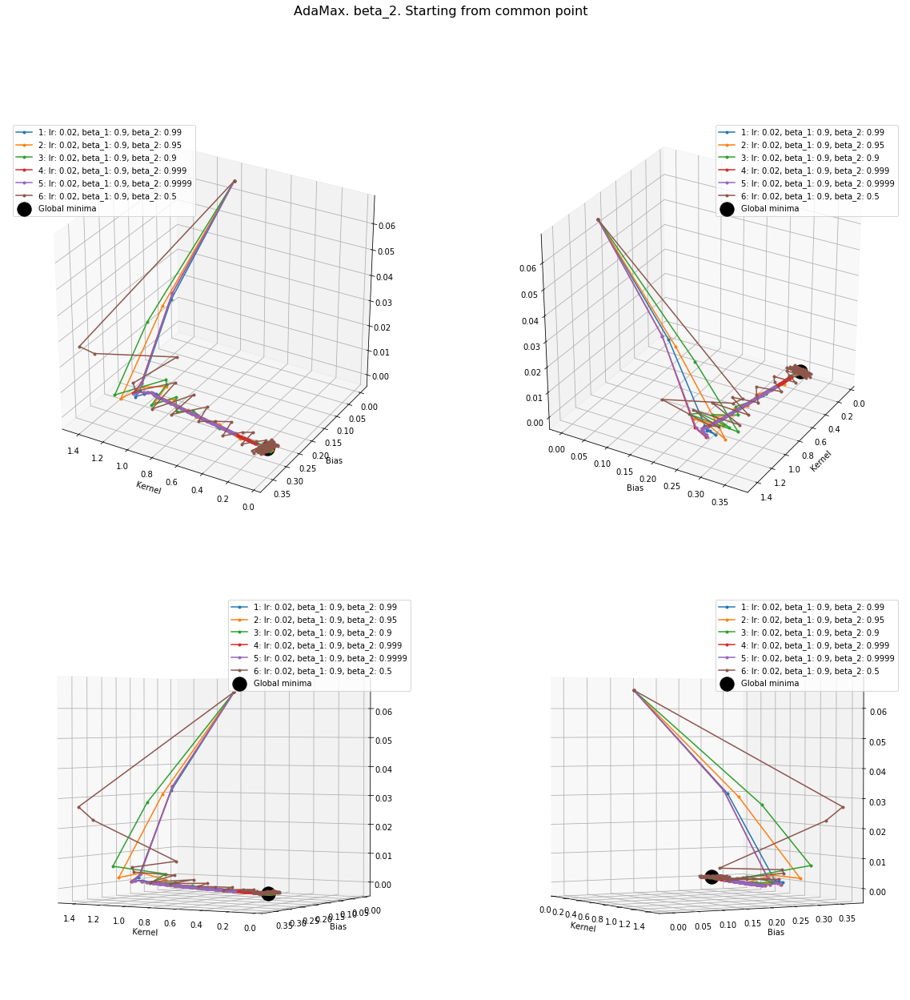

,Configuration,a,b,Prediction for 0.0,Prediction for 1.0,Final MSE
0,"lr: 0.02, beta_1: 0.9, beta_2: 0.99",0.100858,0.300190,0.300190,0.401048,1.830562e-07
1,"lr: 0.02, beta_1: 0.9, beta_2: 0.95",0.100341,0.299561,0.299561,0.399902,3.043172e-07
2,"lr: 0.02, beta_1: 0.9, beta_2: 0.9",0.101430,0.299814,0.299814,0.401245,6.617377e-07
3,"lr: 0.02, beta_1: 0.9, beta_2: 0.999",0.196135,0.295070,0.295070,0.491205,8.101952e-06
4,"lr: 0.02, beta_1: 0.9, beta_2: 0.9999",0.383315,0.285974,0.285974,0.669289,6.841754e-05
5,"lr: 0.02, beta_1: 0.9, beta_2: 0.5",0.131458,0.318048,0.318048,0.449506,2.372264e-04


In [106]:
plot_training(histories['AdaMax. beta_2. Ones'], 'AdaMax. beta_2. Starting from common point')
# plot_training(histories['AdaMax. beta_2. Default'], 'AdaMax. beta_2. Default initialization')

## beta_1 and beta_2

In [107]:
configs = [
    {'lr': 0.02, 'beta_1': 0.99, 'beta_2': 0.9999 },
    {'lr': 0.02, 'beta_1': 0.99, 'beta_2': 0.999 },
    {'lr': 0.02, 'beta_1': 0.99, 'beta_2': 0.99 },
    {'lr': 0.02, 'beta_1': 0.95, 'beta_2': 0.9999 },
    {'lr': 0.02, 'beta_1': 0.95, 'beta_2': 0.999 },
    {'lr': 0.02, 'beta_1': 0.95, 'beta_2': 0.99 },
    {'lr': 0.02, 'beta_1': 0.95, 'beta_2': 0.95 },
    {'lr': 0.02, 'beta_1': 0.9, 'beta_2': 0.9999 },
    {'lr': 0.02, 'beta_1': 0.9, 'beta_2': 0.999 },
    {'lr': 0.02, 'beta_1': 0.9, 'beta_2': 0.99 },
    {'lr': 0.02, 'beta_1': 0.9, 'beta_2': 0.95 },
    {'lr': 0.02, 'beta_1': 0.9, 'beta_2': 0.9 },
]

histories['AdaMax. beta_1 and beta_2. Ones'] = train(configs, 'Adamax', 'ones')
# histories['AdaMax. beta_1 and beta_2. Default'] = train(configs, 'Adamax')

Training config {'lr': 0.02, 'beta_1': 0.99, 'beta_2': 0.9999}
Prediction for 0.: 0.2893, should be 0.3
Prediction for 0.1: 0.5935, should be 0.4
MSE: 3.596382048272062e-05

Training config {'lr': 0.02, 'beta_1': 0.99, 'beta_2': 0.999}
Prediction for 0.: 0.2985, should be 0.3
Prediction for 0.1: 0.4414, should be 0.4
MSE: 1.9463931664631675e-06

Training config {'lr': 0.02, 'beta_1': 0.99, 'beta_2': 0.99}
Prediction for 0.: 0.3076, should be 0.3
Prediction for 0.1: 0.3870, should be 0.4
MSE: 1.799132197675135e-05

Training config {'lr': 0.02, 'beta_1': 0.95, 'beta_2': 0.9999}
Prediction for 0.: 0.2861, should be 0.3
Prediction for 0.1: 0.6611, should be 0.4
MSE: 6.419425189960748e-05

Training config {'lr': 0.02, 'beta_1': 0.95, 'beta_2': 0.999}
Prediction for 0.: 0.2944, should be 0.3
Prediction for 0.1: 0.5032, should be 0.4
MSE: 1.0348547311878064e-05

Training config {'lr': 0.02, 'beta_1': 0.95, 'beta_2': 0.99}
Prediction for 0.: 0.2998, should be 0.3
Prediction for 0.1: 0.4001, sh

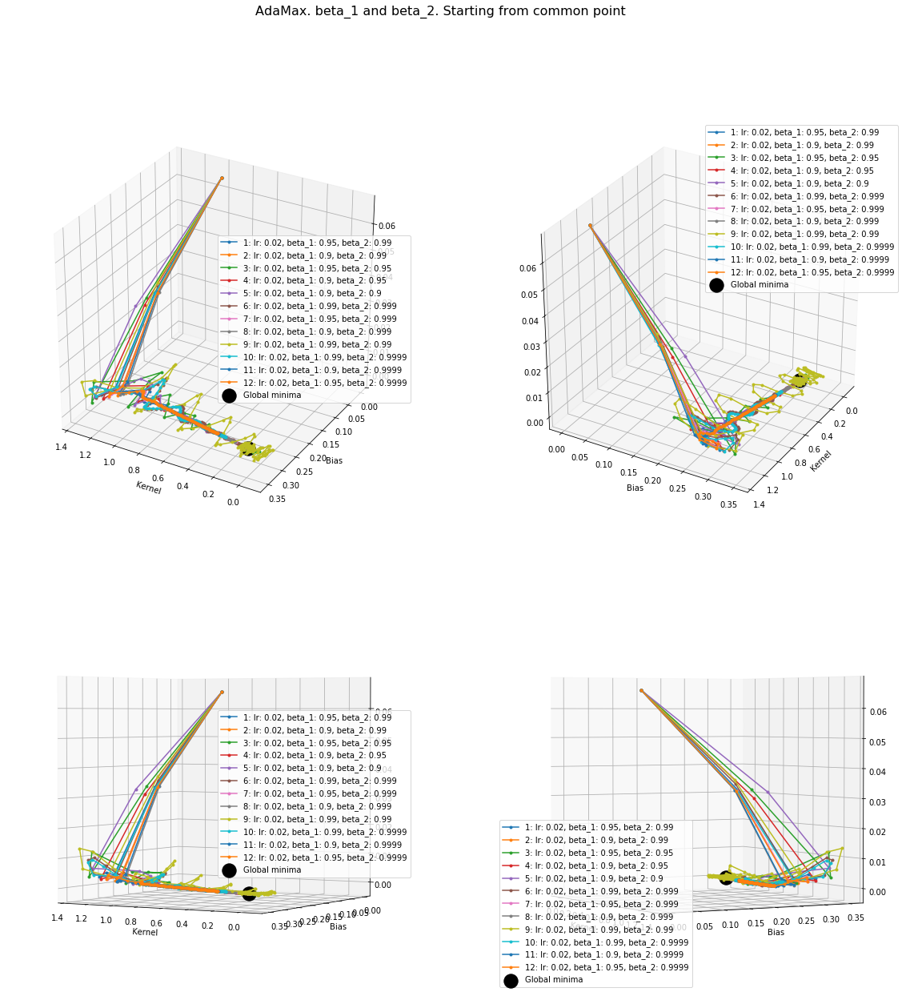

,Configuration,a,b,Prediction for 0.0,Prediction for 1.0,Final MSE
0,"lr: 0.02, beta_1: 0.95, beta_2: 0.99",0.100293,0.299804,0.299804,0.400097,2.804961e-08
1,"lr: 0.02, beta_1: 0.9, beta_2: 0.99",0.099944,0.300295,0.300295,0.400238,1.060384e-07
2,"lr: 0.02, beta_1: 0.95, beta_2: 0.95",0.096218,0.299909,0.299909,0.396127,1.336172e-07
3,"lr: 0.02, beta_1: 0.9, beta_2: 0.95",0.096943,0.299759,0.299759,0.396702,3.243491e-07
4,"lr: 0.02, beta_1: 0.9, beta_2: 0.9",0.100595,0.299964,0.299964,0.400559,6.382815e-07
5,"lr: 0.02, beta_1: 0.99, beta_2: 0.999",0.142849,0.298506,0.298506,0.441356,1.946393e-06
6,"lr: 0.02, beta_1: 0.95, beta_2: 0.999",0.208780,0.294434,0.294434,0.503215,1.034855e-05
7,"lr: 0.02, beta_1: 0.9, beta_2: 0.999",0.217071,0.293987,0.293987,0.511058,1.208343e-05
8,"lr: 0.02, beta_1: 0.99, beta_2: 0.99",0.079464,0.307551,0.307551,0.387015,1.799132e-05
9,"lr: 0.02, beta_1: 0.99, beta_2: 0.9999",0.304255,0.289279,0.289279,0.593534,3.596382e-05


In [108]:
plot_training(histories['AdaMax. beta_1 and beta_2. Ones'], 'AdaMax. beta_1 and beta_2. Starting from common point')
# plot_training(histories['AdaMax. beta_1 and beta_2. Default'], 'AdaMax. beta_1 and beta_2. Default initialization')

# Nadam

## beta_1

In [109]:
configs = [
    {'lr': 0.005, 'beta_1': 0.5, 'beta_2': 0.999 },
    {'lr': 0.005, 'beta_1': 0.9, 'beta_2': 0.999 },
    {'lr': 0.005, 'beta_1': 0.95, 'beta_2': 0.999 },
    {'lr': 0.005, 'beta_1': 0.99, 'beta_2': 0.999 }
]

histories['Nadam. beta_1. Ones'] = train(configs, 'Nadam', 'ones')
# histories['Nadam. beta_1. Default'] = train(configs, 'Nadam')

Training config {'lr': 0.005, 'beta_1': 0.5, 'beta_2': 0.999}
Prediction for 0.: 0.2898, should be 0.3
Prediction for 0.1: 0.5844, should be 0.4
MSE: 3.289393525847117e-05

Training config {'lr': 0.005, 'beta_1': 0.9, 'beta_2': 0.999}
Prediction for 0.: 0.2895, should be 0.3
Prediction for 0.1: 0.5963, should be 0.4
MSE: 3.7306404919945635e-05

Training config {'lr': 0.005, 'beta_1': 0.95, 'beta_2': 0.999}
Prediction for 0.: 0.2888, should be 0.3
Prediction for 0.1: 0.6097, should be 0.4
MSE: 4.228219586366322e-05

Training config {'lr': 0.005, 'beta_1': 0.99, 'beta_2': 0.999}
Prediction for 0.: 0.2869, should be 0.3
Prediction for 0.1: 0.6479, should be 0.4
MSE: 5.872712645214051e-05

------------------------------


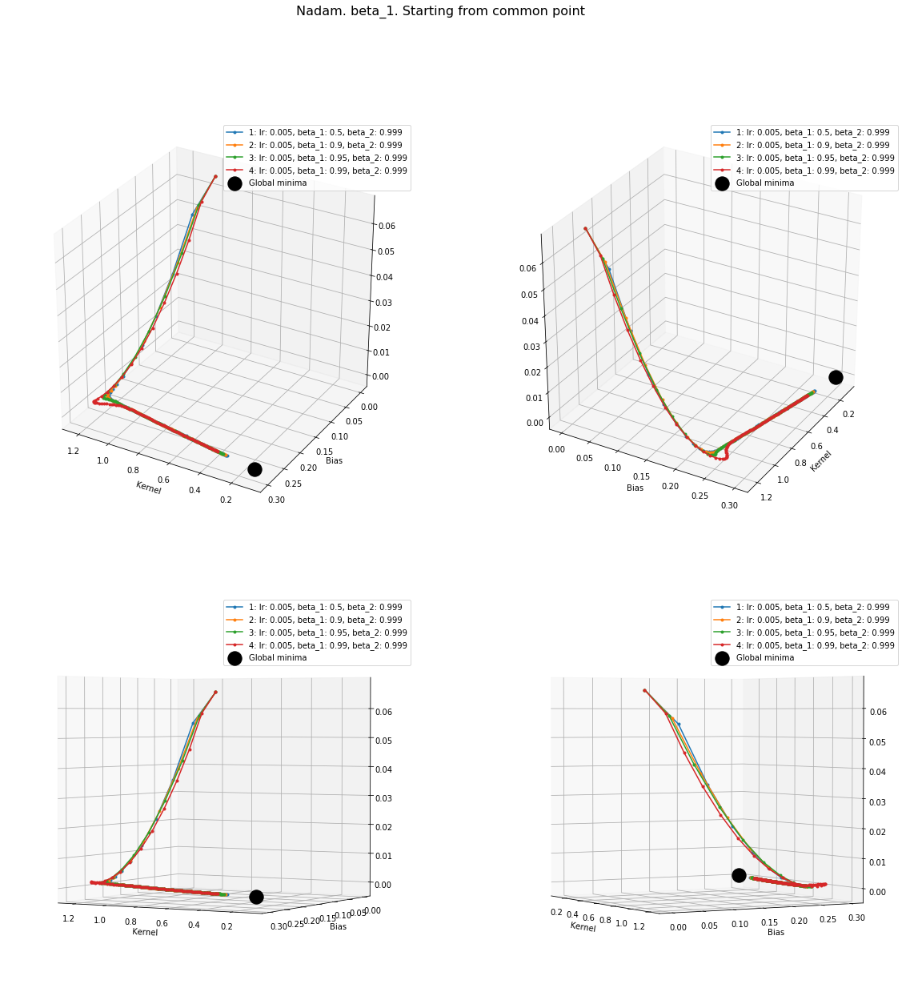

,Configuration,a,b,Prediction for 0.0,Prediction for 1.0,Final MSE
0,"lr: 0.005, beta_1: 0.5, beta_2: 0.999",0.294597,0.289801,0.289801,0.584398,0.000033
1,"lr: 0.005, beta_1: 0.9, beta_2: 0.999",0.306831,0.289454,0.289454,0.596285,0.000037
2,"lr: 0.005, beta_1: 0.95, beta_2: 0.999",0.320858,0.288812,0.288812,0.609670,0.000042
3,"lr: 0.005, beta_1: 0.99, beta_2: 0.999",0.361016,0.286905,0.286905,0.647921,0.000059


In [110]:
plot_training(histories['Nadam. beta_1. Ones'], 'Nadam. beta_1. Starting from common point')
# plot_training(histories['Nadam. beta_1. Default'], 'Nadam. beta_1. Default initialization')

## beta_2

In [111]:
configs = [
    {'lr': 0.005, 'beta_1': 0.9, 'beta_2': 0.999 },
    {'lr': 0.005, 'beta_1': 0.9, 'beta_2': 0.95 },
    {'lr': 0.005, 'beta_1': 0.9, 'beta_2': 0.9 },
    {'lr': 0.005, 'beta_1': 0.9, 'beta_2': 0.5 },
]

histories['Nadam. beta_2. Ones'] = train(configs, 'Nadam', 'ones')
# histories['Nadam. beta_2. Default'] = train(configs, 'Nadam')

Training config {'lr': 0.005, 'beta_1': 0.9, 'beta_2': 0.999}
Prediction for 0.: 0.2895, should be 0.3
Prediction for 0.1: 0.5933, should be 0.4
MSE: 3.658355271909386e-05

Training config {'lr': 0.005, 'beta_1': 0.9, 'beta_2': 0.95}
Prediction for 0.: 0.3018, should be 0.3
Prediction for 0.1: 0.4016, should be 0.4
MSE: 2.024501338837581e-06

Training config {'lr': 0.005, 'beta_1': 0.9, 'beta_2': 0.9}
Prediction for 0.: 0.2989, should be 0.3
Prediction for 0.1: 0.3989, should be 0.4
MSE: 1.9605628040153534e-06

Training config {'lr': 0.005, 'beta_1': 0.9, 'beta_2': 0.5}
Prediction for 0.: 0.2986, should be 0.3
Prediction for 0.1: 0.4002, should be 0.4
MSE: 1.8026409634330775e-06

------------------------------


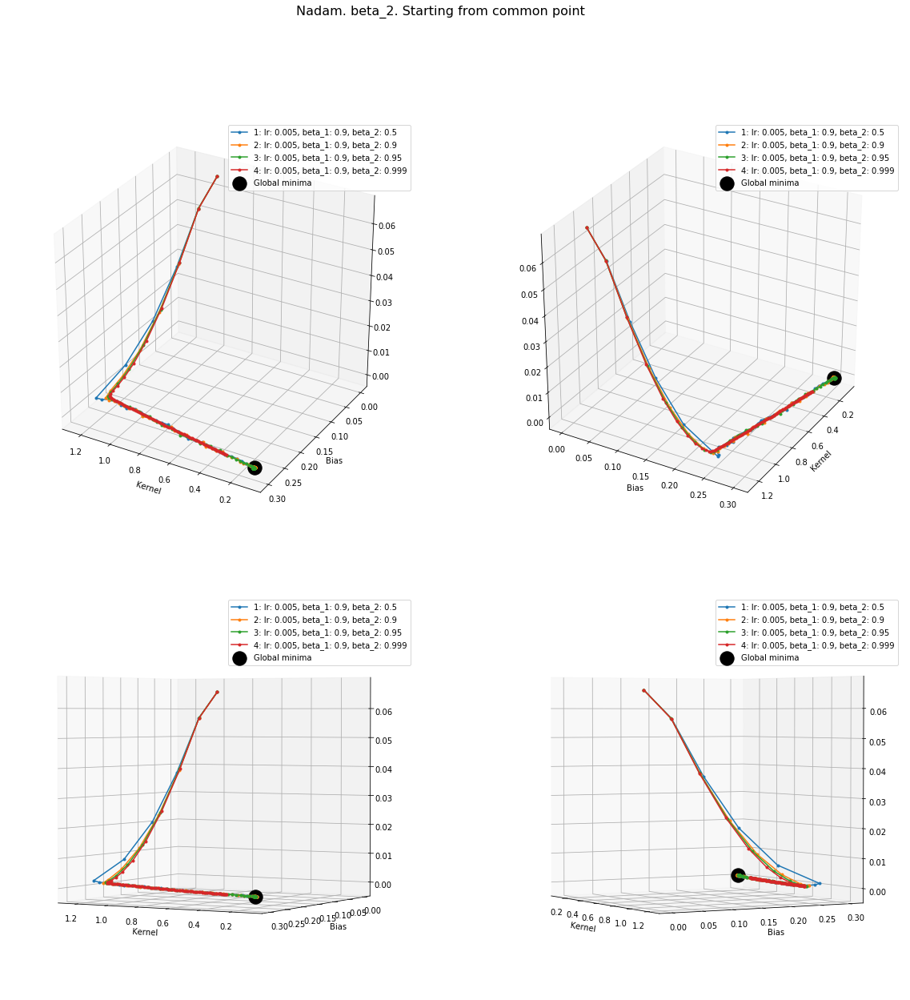

,Configuration,a,b,Prediction for 0.0,Prediction for 1.0,Final MSE
0,"lr: 0.005, beta_1: 0.9, beta_2: 0.5",0.101588,0.298612,0.298612,0.400200,0.000002
1,"lr: 0.005, beta_1: 0.9, beta_2: 0.9",0.100067,0.298883,0.298883,0.398950,0.000002
2,"lr: 0.005, beta_1: 0.9, beta_2: 0.95",0.099833,0.301751,0.301751,0.401583,0.000002
3,"lr: 0.005, beta_1: 0.9, beta_2: 0.999",0.303811,0.289522,0.289522,0.593333,0.000037


In [112]:
plot_training(histories['Nadam. beta_2. Ones'], 'Nadam. beta_2. Starting from common point')
# plot_training(histories['Nadam. beta_2. Default'], 'Nadam. beta_2. Default initialization')

## beta_1 and beta_2

In [113]:
configs = [
    {'lr': 0.005, 'beta_1': 0.5, 'beta_2': 0.9 },
    {'lr': 0.005, 'beta_1': 0.5, 'beta_2': 0.95 },
    {'lr': 0.005, 'beta_1': 0.5, 'beta_2': 0.99 },
    {'lr': 0.005, 'beta_1': 0.5, 'beta_2': 0.999 },
    {'lr': 0.005, 'beta_1': 0.5, 'beta_2': 0.9999 },
    {'lr': 0.005, 'beta_1': 0.9, 'beta_2': 0.9 },
    {'lr': 0.005, 'beta_1': 0.9, 'beta_2': 0.95 },
    {'lr': 0.005, 'beta_1': 0.9, 'beta_2': 0.99 },
    {'lr': 0.005, 'beta_1': 0.9, 'beta_2': 0.999 },
    {'lr': 0.005, 'beta_1': 0.9, 'beta_2': 0.9999 },
    {'lr': 0.005, 'beta_1': 0.95, 'beta_2': 0.9 },
    {'lr': 0.005, 'beta_1': 0.95, 'beta_2': 0.95 },
    {'lr': 0.005, 'beta_1': 0.95, 'beta_2': 0.99 },
    {'lr': 0.005, 'beta_1': 0.95, 'beta_2': 0.999 },
    {'lr': 0.005, 'beta_1': 0.95, 'beta_2': 0.9999 },
    {'lr': 0.005, 'beta_1': 0.99, 'beta_2': 0.99 },
    {'lr': 0.005, 'beta_1': 0.99, 'beta_2': 0.999 },
    {'lr': 0.005, 'beta_1': 0.99, 'beta_2': 0.9999 },
]

histories['Nadam. beta_1 and beta_2. Ones'] = train(configs, 'Nadam', 'ones')
# histories['Nadam. beta_1 and beta_2. Default'] = train(configs, 'Nadam')

Training config {'lr': 0.005, 'beta_1': 0.5, 'beta_2': 0.9}
Prediction for 0.: 0.3022, should be 0.3
Prediction for 0.1: 0.4024, should be 0.4
MSE: 4.49150297754386e-06

Training config {'lr': 0.005, 'beta_1': 0.5, 'beta_2': 0.95}
Prediction for 0.: 0.2982, should be 0.3
Prediction for 0.1: 0.3903, should be 0.4
MSE: 4.7323950184363636e-06

Training config {'lr': 0.005, 'beta_1': 0.5, 'beta_2': 0.99}
Prediction for 0.: 0.3002, should be 0.3
Prediction for 0.1: 0.4018, should be 0.4
MSE: 3.264347459008832e-08

Training config {'lr': 0.005, 'beta_1': 0.5, 'beta_2': 0.999}
Prediction for 0.: 0.2898, should be 0.3
Prediction for 0.1: 0.5849, should be 0.4
MSE: 3.329109167680144e-05

Training config {'lr': 0.005, 'beta_1': 0.5, 'beta_2': 0.9999}
Prediction for 0.: 0.2882, should be 0.3
Prediction for 0.1: 0.6282, should be 0.4
MSE: 4.958096815244062e-05

Training config {'lr': 0.005, 'beta_1': 0.9, 'beta_2': 0.9}
Prediction for 0.: 0.3015, should be 0.3
Prediction for 0.1: 0.3990, should be

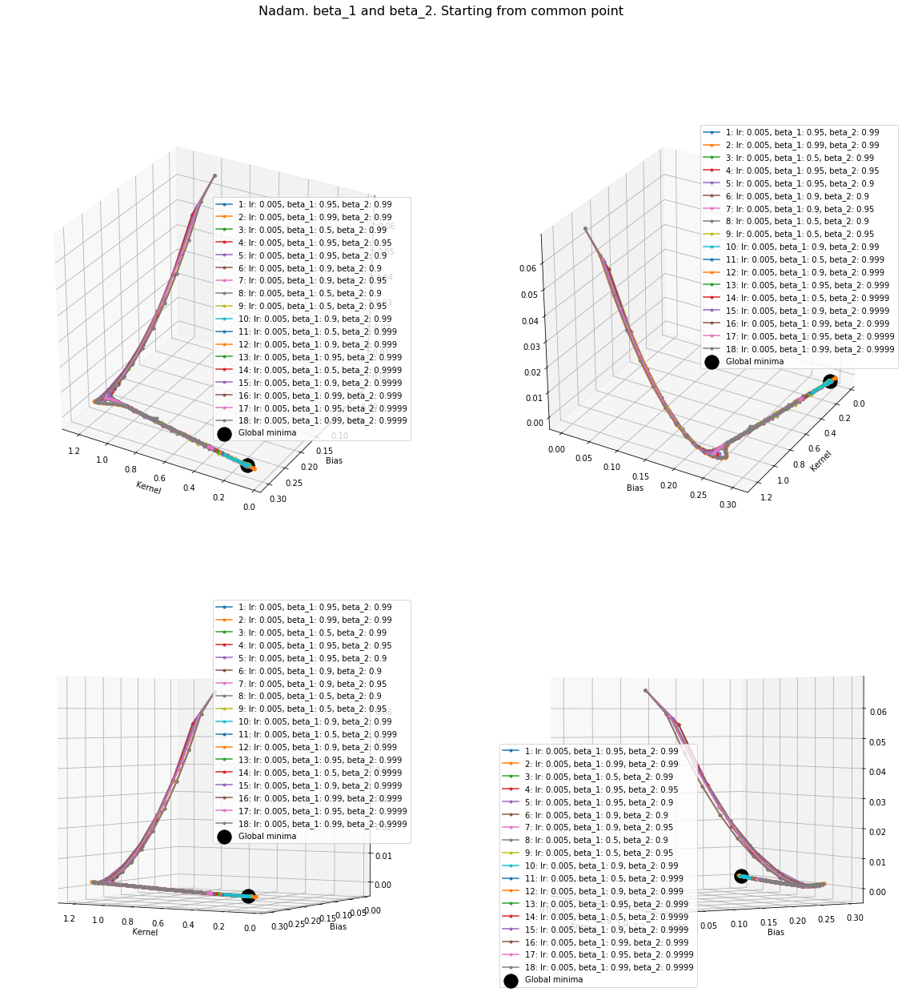

,Configuration,a,b,Prediction for 0.0,Prediction for 1.0,Final MSE
0,"lr: 0.005, beta_1: 0.95, beta_2: 0.99",0.100012,0.300007,0.300007,0.400020,9.112933e-12
1,"lr: 0.005, beta_1: 0.99, beta_2: 0.99",0.102557,0.299881,0.299881,0.402438,2.736898e-09
2,"lr: 0.005, beta_1: 0.5, beta_2: 0.99",0.101629,0.300166,0.300166,0.401795,3.264347e-08
3,"lr: 0.005, beta_1: 0.95, beta_2: 0.95",0.099007,0.301273,0.301273,0.400281,1.542844e-06
4,"lr: 0.005, beta_1: 0.95, beta_2: 0.9",0.099636,0.298828,0.298828,0.398464,1.608555e-06
5,"lr: 0.005, beta_1: 0.9, beta_2: 0.9",0.097473,0.301530,0.301530,0.399003,1.628260e-06
6,"lr: 0.005, beta_1: 0.9, beta_2: 0.95",0.102775,0.300812,0.300812,0.403587,1.848415e-06
7,"lr: 0.005, beta_1: 0.5, beta_2: 0.9",0.100219,0.302230,0.302230,0.402450,4.491503e-06
8,"lr: 0.005, beta_1: 0.5, beta_2: 0.95",0.092123,0.298188,0.298188,0.390311,4.732395e-06
9,"lr: 0.005, beta_1: 0.9, beta_2: 0.99",0.105630,0.299037,0.299037,0.404667,1.124928e-05


In [114]:
plot_training(histories['Nadam. beta_1 and beta_2. Ones'], 'Nadam. beta_1 and beta_2. Starting from common point')
# plot_training(histories['Nadam. beta_1 and beta_2. Default'], 'Nadam. beta_1 and beta_2. Default initialization')

In [115]:
ranking = pd.DataFrame(columns = ['Optimizer', 'Configuration', 'a', 'b', 'Prediction for 0.0', 'Prediction for 1.0', 'Final MSE'])

for key, value in histories.items():
    for i in range(len(value)):
        ranking = ranking.append({
            'Optimizer': value[i]['optimizer'],
            'Configuration': value[i]['label'],
            'a': value[i]['w_a'][-1],
            'b': value[i]['w_b'][-1],
            'Prediction for 0.0': value[i]['pred_0'],
            'Prediction for 1.0': value[i]['pred_01'],
            'Final MSE': value[i]['loss'][-1]
        }, ignore_index=True)

ranking = ranking.sort_values(by=['Final MSE'])        
ranking

,Optimizer,Configuration,a,b,Prediction for 0.0,Prediction for 1.0,Final MSE
67,adam,"amsgrad: False, lr: 0.1, beta_1: 0.95, beta_2:...",0.100000,0.300000,0.300000,0.400000,1.243450e-16
41,rmsp,"rho: 0.9999, lr: 0.01",0.100000,0.300000,0.300000,0.400000,2.309264e-16
81,adam,"amsgrad: True, lr: 0.1, beta_1: 0.9, beta_2: 0.95",0.100000,0.300000,0.300000,0.400000,2.398082e-16
82,adam,"amsgrad: True, lr: 0.1, beta_1: 0.9, beta_2: 0.9",0.100000,0.300000,0.300000,0.400000,2.398082e-16
73,adam,"amsgrad: True, lr: 0.1, beta_1: 0.9, beta_2: 0...",0.100000,0.300000,0.300000,0.400000,3.907985e-16
62,adam,"amsgrad: False, lr: 0.1, beta_1: 0.9, beta_2: ...",0.100000,0.300000,0.300000,0.400000,3.996803e-16
66,adam,"amsgrad: False, lr: 0.1, beta_1: 0.9, beta_2: ...",0.100000,0.300000,0.300000,0.400000,4.085621e-16
84,adam,"amsgrad: True, lr: 0.1, beta_1: 0.9, beta_2: 0...",0.100000,0.300000,0.300000,0.400000,4.263256e-16
86,adam,"amsgrad: True, lr: 0.1, beta_1: 0.95, beta_2: ...",0.100000,0.300000,0.300000,0.400000,4.352074e-16
59,adam,"amsgrad: False, lr: 0.1, beta_1: 0.9, beta_2: ...",0.100000,0.300000,0.300000,0.400000,4.529710e-16
